## Data Preprocessing

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from scipy import stats
import csv

In [5]:
# Read data dari csv 
df = pd.read_csv('C:/Users/ACER/Downloads/data/dataindividu11.csv')
df.head()

,nama,income_user,asset,asset_total,debt,address,RT,RW,zip_code,road_type,...,tenor,ticket_size,besar_angsuran_pokok,besar_angsuran_pokok_dan_bunga,last_contact_with_reply_or_mee_ in_days,means_of_communication,still_have_existing_credit,last_payment_type,last_payment_time_days,target
0,73,0,10,103023000,56000000,5,12,5,10630,2,...,6,120000000,23295768.91,27489007.31,90,0,1,2,50,6
1,65,0,39,100756500,84550000,79,1,7,10150,1,...,6,120000000,23819803.19,28107367.76,90,0,1,2,51,6
2,45,0,1,1214771000,130000000,44,2,6,12510,1,...,34,1450000000,50905261.40,60068208.45,90,4,1,2,51,6
3,30,0,15,828766000,904000000,72,10,19,10430,2,...,20,950000000,54448420.91,64249136.67,90,4,1,2,48,6
4,40,2,17,923053000,800487000,66,5,4,90234,1,...,30,1100000000,43695576.89,51560780.73,90,4,1,2,49,6


Menampilkan info data, berdasarkan syntax dibawah ini didapatkan bahwa data tidak terdapat missing value, dan juga tipe data dari masing-masing variabel

In [6]:
# Read data dari csv 
dfb = pd.read_csv("C:/Users/ACER/Downloads/data/databisnisss.csv",delimiter=";")
dfb.head()

,type_of_business,industry_business_name,business_identification_number_industry,aset,total_aset,debt,last_credit_history,other_credit_history 1,other_credit_history 2,other_credit_history 3,...,all_document_validity,falsification_of_signature_data_letter numbers,address_match,suitability_of_the_size_of_the _company_with_transaction_value,suitability_of_the_company_credit_type_with_ company_prospects,company_reputation_crawl_results,caller_ID_name_on_the_core_of_company,number_of_company_related_articles_on_google,character_of_the_owner_key_figures_in_media,target
0,usaha_menengah,Kelontong (Bukan Departemen Store),47192,"1 rumah, 1 bangunan toko",650000000,"150,000,000",lancar,lancar,lancar,lancar,...,valid,tidak ada,sangat sesuai,sangat sesuai,sangat sesuai,baik,tidak terdeteksi penjulukan nama,cukup banyak,sangat terpercaya,no fraud
1,usaha_menengah,Eceran (Beras),47241,"50 karung beras, 1 bangunan toko",300000000,"120,000,000",lancar,lancar,lancar,lancar,...,valid,tidak ada,sangat sesuai,sangat sesuai,sangat sesuai,sangat baik,tidak terdeteksi penjulukan nama,banyak,cukup terpercaya,no fraud
2,usaha_menengah,Perdagangan Eceran Ikan Hias,47753,"1 rumah, 1 bangunan toko",450000000,"80,000,000",lancar,lancar,kurang lancar,lancar,...,valid,tidak ada,sangat sesuai,sangat sesuai,sangat sesuai,baik,tidak terdeteksi penjulukan nama,cukup banyak,cukup terpercaya,no fraud
3,usaha_besar,Perdagangan Material Bangunan,46638,"100 karung semen, 3 ton pasir, 250 kaleng cat,...",2000000000,"780,000,000",lancar,kurang lancar,lancar,dalam perhatian khusus,...,valid,tidak ada,cukup sesuai,cukup sesuai,sangat sesuai,baik,tidak terdeteksi penjulkkan nama,tidak banyak,cukup terpercaya,no fraud
4,usaha_menengah,Praktik Dokter Gigi,86023,1 rumah,500000000,"200,000,000",lancar,lancar,kurang lancar,dalam perhatian khusus,...,unreadable,ada,cukup sesuai,cukup sesuai,sangat sesuai,cukup baik,tidak terdeteksi penjulukkan nama,tidak banyak,kurang terpercaya,is fraud


In [7]:
# Insert several variables from business to personal
df['type_of_business'] = dfb['type_of_business'].fillna("No")
df['industry_business_name'] = dfb['industry_business_name'].fillna("not included")
df['business_identification_number_industry'] = dfb['business_identification_number_industry'].fillna("not included")
df['credit_purpose'] = dfb['credit_purpose'].fillna("not included")
df['type_of_product'] = dfb['type_of_product'].fillna("not included")
df['average_sales_not_profit'] = dfb['average_sales_not_profit'].fillna("not included")
df['amount_of_principal_installment'] = dfb['amount_of_principal_installment'].fillna("No")
df['amount_of_principal_installment_dan_principal_interest'] = dfb['amount_of_principal_installment_dan_principal_interest'].fillna("not included")
df['company_address'] = dfb['company_address'].fillna("not included")
df['last_24_months_credit_perfomance'] = dfb['last_24_months_credit_perfomance'].fillna("not included")
df['business_prospects'] = dfb['business_prospects'].fillna("not included")
df['business_threat'] = dfb['business_threat'].fillna("not included")
df['key_person_ID_existence'] = dfb['key_person_ID_existence'].fillna("No")
df['existency_badan_usaha'] = dfb['existency_badan_usaha'].fillna("not included")
df['all_document_validity'] = dfb['all_document_validity'].fillna("not included")
df['falsification_of_signature_data_letter numbers'] = dfb['falsification_of_signature_data_letter numbers'].fillna("not included")
df['address_match'] = dfb['address_match'].fillna("not included")
df['suitability_of_the_size_of_the _company_with_transaction_value'] = dfb['suitability_of_the_size_of_the _company_with_transaction_value'].fillna("not included")
df['suitability_of_the_company_credit_type_with_ company_prospects'] = dfb['suitability_of_the_company_credit_type_with_ company_prospects'].fillna("No")
df['company_reputation_crawl_results'] = dfb['company_reputation_crawl_results'].fillna("not included")
df['caller_ID_name_on_the_core_of_company'] = dfb['caller_ID_name_on_the_core_of_company'].fillna("not included")
df['number_of_company_related_articles_on_google'] = dfb['number_of_company_related_articles_on_google'].fillna("not included")
df['character_of_the_owner_key_figures_in_media'] = dfb['character_of_the_owner_key_figures_in_media'].fillna("not included")
df['suitability_of_the_size_of_the _company_with_transaction_value'] = dfb['suitability_of_the_size_of_the _company_with_transaction_value'].fillna("not included")

# Move the variables
column = df.pop('type_of_business')
df.insert(31, 'type_of_business', column)
column = df.pop('industry_business_name')
df.insert(33, 'industry_business_name', column)
column = df.pop('business_identification_number_industry')
df.insert(34, 'business_identification_number_industry', column)
column = df.pop('credit_purpose')
df.insert(35, 'credit_purpose', column)
column = df.pop('type_of_product')
df.insert(37, 'type_of_product', column)
column = df.pop('average_sales_not_profit')
df.insert(38, 'average_sales_not_profit', column)
column = df.pop('amount_of_principal_installment')
df.insert(31, 'amount_of_principal_installment', column)
column = df.pop('amount_of_principal_installment_dan_principal_interest')
df.insert(33, 'amount_of_principal_installment_dan_principal_interest', column)
column = df.pop('company_address')
df.insert(34, 'company_address', column)
column = df.pop('last_24_months_credit_perfomance')
df.insert(35, 'last_24_months_credit_perfomance', column)
column = df.pop('business_prospects')
df.insert(37, 'business_prospects', column)
column = df.pop('business_threat')
df.insert(38, 'business_threat', column)
column = df.pop('key_person_ID_existence')
df.insert(31, 'key_person_ID_existence', column)
column = df.pop('existency_badan_usaha')
df.insert(33, 'existency_badan_usaha', column)
column = df.pop('all_document_validity')
df.insert(34, 'all_document_validity', column)
column = df.pop('falsification_of_signature_data_letter numbers')
df.insert(35, 'falsification_of_signature_data_letter numbers', column)
column = df.pop('address_match')
df.insert(37, 'address_match', column)
column = df.pop('suitability_of_the_size_of_the _company_with_transaction_value')
df.insert(38, 'suitability_of_the_size_of_the _company_with_transaction_value', column)
column = df.pop('suitability_of_the_company_credit_type_with_ company_prospects')
df.insert(31, 'suitability_of_the_company_credit_type_with_ company_prospects', column)
column = df.pop('company_reputation_crawl_results')
df.insert(33, 'company_reputation_crawl_results', column)
column = df.pop('caller_ID_name_on_the_core_of_company')
df.insert(34, 'caller_ID_name_on_the_core_of_company', column)
column = df.pop('number_of_company_related_articles_on_google')
df.insert(35, 'number_of_company_related_articles_on_google', column)
column = df.pop('character_of_the_owner_key_figures_in_media')
df.insert(37, 'character_of_the_owner_key_figures_in_media', column)
column = df.pop('suitability_of_the_size_of_the _company_with_transaction_value')
df.insert(38, 'suitability_of_the_size_of_the _company_with_transaction_value', column)

# Check the simple info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 71 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   nama                                                            100 non-null    int64  
 1   income_user                                                     100 non-null    int64  
 2   asset                                                           100 non-null    int64  
 3   asset_total                                                     100 non-null    int64  
 4   debt                                                            100 non-null    int64  
 5   address                                                         100 non-null    int64  
 6   RT                                                              100 non-null    int64  
 7   RW                                                    

In [8]:
df.head()

,nama,income_user,asset,asset_total,debt,address,RT,RW,zip_code,road_type,...,tenor,ticket_size,besar_angsuran_pokok,besar_angsuran_pokok_dan_bunga,last_contact_with_reply_or_mee_ in_days,means_of_communication,still_have_existing_credit,last_payment_type,last_payment_time_days,target
0,73,0,10,103023000,56000000,5,12,5,10630,2,...,6,120000000,23295768.91,27489007.31,90,0,1,2,50,6
1,65,0,39,100756500,84550000,79,1,7,10150,1,...,6,120000000,23819803.19,28107367.76,90,0,1,2,51,6
2,45,0,1,1214771000,130000000,44,2,6,12510,1,...,34,1450000000,50905261.40,60068208.45,90,4,1,2,51,6
3,30,0,15,828766000,904000000,72,10,19,10430,2,...,20,950000000,54448420.91,64249136.67,90,4,1,2,48,6
4,40,2,17,923053000,800487000,66,5,4,90234,1,...,30,1100000000,43695576.89,51560780.73,90,4,1,2,49,6


In [9]:
print(dfb.dtypes)

type_of_business                                                   object
industry_business_name                                             object
business_identification_number_industry                             int64
aset                                                               object
total_aset                                                         object
debt                                                               object
last_credit_history                                                object
other_credit_history 1                                             object
other_credit_history 2                                             object
other_credit_history 3                                             object
worst_credit_perfomance                                            object
credit_purpose                                                     object
type_of_product                                                    object
average_sales_not_profit              

In [10]:
#Convert all the non-numeric columns to numerical data types ## SEBAIKNYA NUMERIC DI SCALER
for column in df.columns:
    if df[column].dtype == np.number: continue
    # Perform encoding for each non-numeric column
    df[column] = LabelEncoder().fit_transform(df[column])
df

C:\Users\ACER\AppData\Local\Temp\ipykernel_3504\3790733932.py:3: DeprecationWarning: Converting `np.inexact` or `np.floating` to a dtype is deprecated. The current result is `float64` which is not strictly correct.
  if df[column].dtype == np.number: continue


,nama,income_user,asset,asset_total,debt,address,RT,RW,zip_code,road_type,...,tenor,ticket_size,besar_angsuran_pokok,besar_angsuran_pokok_dan_bunga,last_contact_with_reply_or_mee_ in_days,means_of_communication,still_have_existing_credit,last_payment_type,last_payment_time_days,target
0,73,0,10,4,21,5,12,5,17,2,...,0,9,23295768.91,27489007.31,52,0,1,2,50,6
1,65,0,39,2,23,79,1,7,3,1,...,0,9,23819803.19,28107367.76,52,0,1,2,51,6
2,45,0,1,51,29,44,2,6,42,1,...,12,53,50905261.40,60068208.45,52,4,1,2,51,6
3,30,0,15,39,78,72,10,19,13,2,...,6,39,54448420.91,64249136.67,52,4,1,2,48,6
4,40,2,17,42,71,66,5,4,79,1,...,11,42,43695576.89,51560780.73,52,4,1,2,49,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,81,4,30,89,47,9,1,1,32,1,...,11,60,41828709.71,49357877.45,1,4,1,3,0,0
96,82,4,20,92,82,91,0,2,10,1,...,14,64,40706126.69,48033229.49,5,1,1,1,5,0
97,39,4,29,88,45,97,9,8,7,1,...,6,57,45037531.28,53144286.91,3,4,1,3,4,0
98,91,4,22,87,39,90,0,0,36,1,...,16,56,21386800.33,25236424.39,4,4,1,3,3,0


In [11]:
#df.to_csv('datalagi.csv', index=False)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 71 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   nama                                                            100 non-null    int64  
 1   income_user                                                     100 non-null    int64  
 2   asset                                                           100 non-null    int64  
 3   asset_total                                                     100 non-null    int64  
 4   debt                                                            100 non-null    int64  
 5   address                                                         100 non-null    int64  
 6   RT                                                              100 non-null    int64  
 7   RW                                                    

Menampilkan deskripsi data, yang terdapat count, mean, standar deviasi, nilai minimum, kuartil bawah, kuartil atas, dan nilai maksimum dari masing-masing variabel dataset

In [13]:
df.describe()

,nama,income_user,asset,asset_total,debt,address,RT,RW,zip_code,road_type,...,tenor,ticket_size,besar_angsuran_pokok,besar_angsuran_pokok_dan_bunga,last_contact_with_reply_or_mee_ in_days,means_of_communication,still_have_existing_credit,last_payment_type,last_payment_time_days,target
count,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,...,100.000000,100.000000,1.000000e+02,1.000000e+02,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,49.500000,2.15000,24.550000,47.320000,46.180000,49.500000,7.230000,6.390000,37.990000,1.17000,...,13.320000,35.350000,1.232520e+09,1.480356e+09,27.110000,2.040000,0.990000,2.350000,26.870000,3.000000
std,29.011492,1.27426,12.960994,27.033791,27.449266,29.011492,7.530215,5.193031,22.674462,0.58698,...,6.571871,18.138844,2.092902e+09,2.367385e+09,17.464478,1.786142,0.559491,1.113508,16.638555,2.035046
min,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,3.922518e+06,2.972476e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,24.750000,1.00000,14.000000,24.750000,22.750000,24.750000,1.750000,3.000000,19.000000,1.00000,...,8.750000,20.000000,2.825850e+07,3.362001e+07,11.750000,0.000000,1.000000,2.000000,12.000000,1.000000
50%,49.500000,2.00000,24.500000,48.000000,46.500000,49.500000,5.000000,5.000000,36.500000,1.00000,...,14.000000,39.500000,4.327636e+07,5.232449e+07,27.500000,1.500000,1.000000,2.000000,26.000000,3.000000
75%,74.250000,3.00000,36.000000,70.250000,70.000000,74.250000,11.000000,9.250000,56.250000,2.00000,...,18.000000,51.000000,1.772192e+09,2.273782e+09,42.250000,4.000000,1.000000,3.000000,42.000000,5.000000
max,99.000000,4.00000,46.000000,93.000000,93.000000,99.000000,29.000000,20.000000,80.000000,2.00000,...,26.000000,65.000000,9.696970e+09,8.369445e+09,52.000000,4.000000,2.000000,5.000000,52.000000,6.000000


Untuk menampilkan banyaknya data yang hilang pada dataset, dan didapatkan hasil bahwa tidak ada data hilang pada dataset

In [14]:
df.nunique()

nama                          100
income_user                     5
asset                          47
asset_total                    94
debt                           94
                             ... 
means_of_communication          5
still_have_existing_credit      3
last_payment_type               6
last_payment_time_days         53
target                          7
Length: 71, dtype: int64

In [15]:
# Drop kolom 
#df.drop(['No', 'Nama', 'RT', 'RW', 'zip_code','IP_address','address','hardware_used','last_user_behavior_recorded_date'], axis=1, inplace =True)

In [16]:
df.nunique()

nama                          100
income_user                     5
asset                          47
asset_total                    94
debt                           94
                             ... 
means_of_communication          5
still_have_existing_credit      3
last_payment_type               6
last_payment_time_days         53
target                          7
Length: 71, dtype: int64

In [17]:
df.isnull().sum()

nama                          0
income_user                   0
asset                         0
asset_total                   0
debt                          0
                             ..
means_of_communication        0
still_have_existing_credit    0
last_payment_type             0
last_payment_time_days        0
target                        0
Length: 71, dtype: int64

Untuk menampilkan banyaknya data yang sama atau terduplicate, didapatkan bahwa tidak ada data yang sama atau terduplicate.

Untuk Menanggulangi data yang terduplicate dapat menggunakan syntax berikut ini

df.drop_duplicates(inplace=True)

In [18]:
df.duplicated().sum()

0

In [19]:
# df.drop_duplicates(inplace=True)

Untuk menampilkan banyaknya data dan kolom, didapatkan bahwa data memiliki 50 variabel dengan masing-masing unit observasinya 100

In [20]:
df.shape

(100, 71)

Transformasi data dengan memberikan keterangan pada data nominal dan ordinal

In [21]:
df_vis=df.copy()

In [22]:
df_vis["income_user"] = df_vis["income_user"].replace({0: "<5jt", 1: "5-10jt", 2: "10-15jt", 3: "15-20jt", 4:">20jt" }) #?nnnnnnnnnnnnnnnnnnnnnn
df_vis["road_type"] = df_vis["road_type"].replace({0: "jalan kecil", 1: "jalan sedang", 2:"jalan raya"})
df_vis["location_criminality"] = df_vis["location_criminality"].replace({0: "rendah", 1: "sedang", 2: "tinggi"})
df_vis["address_suitability"] = df_vis["address_suitability"].replace({0: 'tidak sesuai', 1: 'sesuai'})
df_vis["transaction_purpose"] = df_vis["transaction_purpose"].replace({0: "Konsumsi Pribadi", 1: "Investasi", 2: "Peralatan Kerja", 3: "Persediaan", 4:"Peralatan Rumah Tangga", 5:"Hadiah/Pemberian", 6: "Kebutuhan Bisnis"})
df_vis["payment_method"] = df_vis["payment_method"].replace({0: "Tunai", 1: "Transfer bank", 2: "Kartu Kredit", 3: "Debit Kartu", 4: "Pembayaran Elektronik", 5: "Leasing"})
df_vis["user_behavior"] = df_vis["user_behavior"].replace({0: "bad", 1: "normal", 2: "good"})
df_vis["last_credit_user"] = df_vis["last_credit_user"].replace({0: "no", 1: "yes"})
df_vis["last_user_behavior_status"] = df_vis["last_user_behavior_status"] .replace({0: "none", 1: "Bad", 2: "Good", 3: "Great"})
df_vis["worst_credit_performance"] = df_vis["worst_credit_performance"].replace({0: "none", 1: "macet", 2: "diragukan", 3: "dalam perhatian khusus", 4: "kurang lancar", 5: "lancar"})
df_vis["last_ SLIK_RECORD_performance"] = df_vis["last_ SLIK_RECORD_performance"].replace({0: "none", 1: "macet", 2: "diragukan", 3: "dalam perhatian khusus", 4: "kurang lancar", 5: "lancar"})
df_vis["last_ SLIK_RECORD_type_of_credit"] = df_vis["last_ SLIK_RECORD_type_of_credit"].replace({0: "none", 1: "Konsumsi Pribadi", 2: "Investasi", 3: "Peralatan Kerja", 4: "Persediaan", 5: "Peralatan Rumah Tangga", 6: "Hadiah/Pemberian", 7:"Kebutuhan Bisnis"})
df_vis["last_credit_survey_process"] = df_vis["last_credit_survey_process"].replace({0: "none", 1: "<1 bulan", 2: "1-3 bulan", 3: "3-6 bulan", 4: "6-9 bulan", 5: "9-12 bulan", 6: "> 12 bulan"})
df_vis["speed_of_credit_process"] = df_vis["speed_of_credit_process"].replace({0: "none", 1: "low", 2: "medium", 3: "high"})
df_vis["credit_scoring"] = df_vis["credit_scoring"].replace({0: "belum pernah", 1: "bad", 2: "poor", 3: "fair", 4: "good", 5: "excellent"})
df_vis["operating_system_type"] = df_vis["operating_system_type"].replace({0: "android", 1: "iOS", 2: "macOS", 3: "microsoft windows", 4: "Linux"})
df_vis["used_browser"] = df_vis["used_browser"].replace({0: "unknown", 1: "google chrome", 2: "Mozilla Firefox", 3: "Apple Safari", 4: "Opera", 5: "Brave"})
df_vis["credit_purpose"] = df_vis["credit_purpose"].replace({0: "Kredit rumah", 1: "Kredit mobil", 2: "Kredit konsumsi", 3: "Kredit usaha", 4: "Kredit investasi", 5: "Kredit kartu kredit"})
df_vis["means_of_communication"] = df_vis["means_of_communication"].replace({0: "phone", 1: "WA", 2: "surat", 3: "onsite", 4: "email"})
df_vis["still_have_existing_credit"] = df_vis["still_have_existing_credit"].replace({0: "none", 1: "sedang berjalan", 2: "lunas"})
df_vis["last_payment_type"] = df_vis["last_payment_type"].replace({0: "Tunai", 1: "Transfer bank", 2: "Kartu Kredit", 3: "Debit Kartu", 4: "Pembayaran Elektronik", 5: "Leasing", 6: "Bitcoin"})
df_vis["target"] = df_vis["target"].replace({0: "no fraud", 1: "suspect", 2: "medium risk", 3: "high risk", 4: "common fraud", 5: "mafia fraud", 6: "fraud"})
df_vis["type_of_business"] = df_vis["type_of_business"].replace({0: "Usaha Wholesale", 1: "Usaha Kecil", 2: "Usaha Menengah", 3: "Usaha Besar"})
df_vis["last_credit_history"] = df_vis["last_credit_history"].replace({0: "Lancar", 1: "Dalam Perhatian Khusus", 2: "Diragukan", 3: "Kurang Lancar", 4: "Tidak Lancar"})
df_vis["other_credit_history1"] = df_vis["other_credit_history1"].replace({0: "Lancar", 1: "Dalam Perhatian Khusus", 2: "Diragukan", 3: "Kurang Lancar", 4: "Tidak Lancar"})
df_vis["other_credit_history2"] = df_vis["other_credit_history2"].replace({0: "Lancar", 1: "Dalam Perhatian Khusus", 2: "Diragukan", 3: "Kurang Lancar", 4: "Tidak Lancar"})
df_vis["other_credit_history3"] = df_vis["other_credit_history3"].replace({0: "Lancar", 1: "Dalam Perhatian Khusus", 2: "Diragukan", 3: "Kurang Lancar", 4: "Tidak Lancar"})
df_vis["credit_purpose"] = df_vis["credit_purpose"].replace({0: "Modal Kerja", 1: "Modal Usaha", 2: "Ekspansi Bisnis", 3: "Biaya Operasional"})
df_vis["type_of_product"] = df_vis["type_of_product"].replace({0: "Baru", 1: "Bekas"})
df_vis["business_prospects"] = df_vis["business_prospects"].replace({0: "Low", 1: "Medium", 2: "High"})
df_vis["business_threat"] = df_vis["business_threat"].replace({0: "Low", 1: "Medium", 2: "High"})
df_vis["key_person_ID_existence"] = df_vis["key_person_ID_existence"].replace({0: "Real", 1: "Some Problem Exist", 2: "Undetected", 3: "Not Real"})
df_vis["existency_badan_usaha"] = df_vis["existency_badan_usaha"].replace({0: "Real", 1: "Some Problem Exist", 2: "Undetected", 3: "Not Real"})
df_vis["all_document_validity"] = df_vis["all_document_validity"].replace({0: "Valid", 1: "Unreadable", 2: "Not Include", 3: "Fraud", 4: "Expired"})
df_vis["falsification_of_signature_data_letter numbers"] = df_vis["falsification_of_signature_data_letter numbers"].replace({0: "Tidak Ada", 1: "Ada"})
df_vis["address_match"] = df_vis["address_match"].replace({0: "Sangat Sesuai", 1: "Cukup Sesuai", 2: "Tidak Sesuai"})
df_vis["suitability_of_the_size_of_the _company_with_transaction_value"] = df_vis["suitability_of_the_size_of_the _company_with_transaction_value"].replace({0: "Sangat Sesuai", 1: "Cukup Sesuai", 2: "Tidak Sesuai"})
df_vis["suitability_of_the_company_credit_type_with_ company_prospects"] = df_vis["suitability_of_the_company_credit_type_with_ company_prospects"].replace({0: "Sangat Sesuai", 1: "Cukup Sesuai", 2: "Tidak Sesuai"})
df_vis["company_reputation_crawl_results"] = df_vis["company_reputation_crawl_results"].replace({0: "Sangat Sesuai", 1: "Cukup Sesuai", 2: "Tidak Sesuai"})
df_vis["caller_ID_name_on_the_core_of_company"] = df_vis["caller_ID_name_on_the_core_of_company"].replace({0: "Sangat Sesuai", 1: "Cukup Sesuai", 2: "Tidak Sesuai"})
df_vis["number_of_company_related_articles_on_google"] = df_vis["number_of_company_related_articles_on_google"].replace({0: "Sangat Sesuai", 1: "Cukup Sesuai", 2: "Tidak Sesuai"})
df_vis["character_of_the_owner_key_figures_in_media"] = df_vis["character_of_the_owner_key_figures_in_media"].replace({0: "Sangat Sesuai", 1: "Cukup Sesuai", 2: "Tidak Sesuai"})

In [23]:
df_vis.head()

,nama,income_user,asset,asset_total,debt,address,RT,RW,zip_code,road_type,...,tenor,ticket_size,besar_angsuran_pokok,besar_angsuran_pokok_dan_bunga,last_contact_with_reply_or_mee_ in_days,means_of_communication,still_have_existing_credit,last_payment_type,last_payment_time_days,target
0,73,<5jt,10,4,21,5,12,5,17,jalan raya,...,0,9,23295768.91,27489007.31,52,phone,sedang berjalan,Kartu Kredit,50,fraud
1,65,<5jt,39,2,23,79,1,7,3,jalan sedang,...,0,9,23819803.19,28107367.76,52,phone,sedang berjalan,Kartu Kredit,51,fraud
2,45,<5jt,1,51,29,44,2,6,42,jalan sedang,...,12,53,50905261.40,60068208.45,52,email,sedang berjalan,Kartu Kredit,51,fraud
3,30,<5jt,15,39,78,72,10,19,13,jalan raya,...,6,39,54448420.91,64249136.67,52,email,sedang berjalan,Kartu Kredit,48,fraud
4,40,10-15jt,17,42,71,66,5,4,79,jalan sedang,...,11,42,43695576.89,51560780.73,52,email,sedang berjalan,Kartu Kredit,49,fraud


Untuk melihat banyaknya nilai unik pada masing-masing variabel pada dataset

In [24]:
unique_values = {}
for col in df_vis.columns:
    unique_values[col] = df_vis[col].value_counts().shape[0]

pd.DataFrame(unique_values, index=["unique value count"]).transpose()

,unique value count
nama,100
income_user,5
asset,47
asset_total,94
debt,94
...,...
means_of_communication,5
still_have_existing_credit,3
last_payment_type,6
last_payment_time_days,53


In [25]:
df['income_user'] = df['income_user'].astype(int) 
df['asset_total'] = df['asset_total'].astype(int)
df['debt'] = df['debt'].astype(int)
df['location_criminality'] = df['location_criminality'].astype(int)
df['address_suitability'] = df['address_suitability'].astype(int)
df['amount_of_money_spent'] = df['amount_of_money_spent'].astype(int)
df['last_12_months_cost_of_collection'] = df['last_12_months_cost_of_collection'].astype(int)
df['credit_scoring'] = df['credit_scoring'].astype(int)
df['tenor'] = df['tenor'].astype(int)
df['ticket_size'] = df['ticket_size'].astype(int)
df['loan_to_value'] = df['loan_to_value'].astype(int)
df['besar_angsuran_pokok'] = df['besar_angsuran_pokok'].astype(int)
df['besar_angsuran_pokok_dan_bunga'] = df['besar_angsuran_pokok_dan_bunga'].astype(int)
df['last_contact_with_reply_or_mee_ in_days'] = df['last_contact_with_reply_or_mee_ in_days'].astype(int)	
df['still_have_existing_credit'] = df['still_have_existing_credit'].astype(int)
df['target'] = df['target'].astype(int)
df["type_of_business"] = df["type_of_business"].astype(int)
df["last_credit_history"] = df["last_credit_history"].astype(int)
df["other_credit_history1"] = df["other_credit_history1"].astype(int)
df["other_credit_history2"] = df["other_credit_history2"].astype(int)
df["other_credit_history3"] = df["other_credit_history3"].astype(int)
df["credit_purpose"] = df["credit_purpose"].astype(int)
df["type_of_product"] = df["type_of_product"].astype(int)
df["means_of_communication"] = df["means_of_communication"].astype(int)
df["still_have_existing_credit"] = df["still_have_existing_credit"].astype(int)
df["last_payment_type"] = df["last_payment_type"].astype(int)
df["last_user_behavior_status"] = df["last_user_behavior_status"].astype(int)
df["speed_of_credit_process"] = df["speed_of_credit_process"].astype(int)
df["business_prospects"] = df["business_prospects"].astype(int)
df["business_threat"] = df["business_threat"].astype(int)
df["key_person_ID_existence"] = df["key_person_ID_existence"].astype(int)
df["existency_badan_usaha"] = df["existency_badan_usaha"].astype(int)
df["all_document_validity"] = df["all_document_validity"].astype(int)
df["falsification_of_signature_data_letter numbers"] = df["falsification_of_signature_data_letter numbers"].astype(int)
df["address_match"] = df["address_match"].astype(int)
df["suitability_of_the_size_of_the _company_with_transaction_value"] = df["suitability_of_the_size_of_the _company_with_transaction_value"].astype(int)
df["suitability_of_the_company_credit_type_with_ company_prospects"] = df["suitability_of_the_company_credit_type_with_ company_prospects"].astype(int)
df["company_reputation_crawl_results"] = df["company_reputation_crawl_results"].astype(int)
df["caller_ID_name_on_the_core_of_company"] = df["caller_ID_name_on_the_core_of_company"].astype(int)
df["number_of_company_related_articles_on_google"] = df["number_of_company_related_articles_on_google"].astype(int)
df["character_of_the_owner_key_figures_in_media"] = df["character_of_the_owner_key_figures_in_media"].astype(int)

In [26]:
df_2 = pd.DataFrame({
    'income_user': df['income_user'], 
    'asset_total': df['asset_total'], 
    'debt': df['debt'], 
    'road_type': df['road_type'], 
    'location_criminality': df['location_criminality'], 
    'address_suitability': df['address_suitability'], 
    'amount_of_money_spent': df['amount_of_money_spent'], 
    'transaction_purpose': df['transaction_purpose'], 
    'payment_method' : df['payment_method'], 
    'user_behavior' : df['user_behavior'], 
    'last_credit_user' : df['last_credit_user'], 
    'last_user_behavior_status' : df['last_user_behavior_status'], 
    'last_credit_history' : df['last_credit_history'], 
    'other_credit_history1' : df['other_credit_history1'], 
    'other_credit_history2' : df['other_credit_history2'], 
    'other_credit_history3' : df['other_credit_history3'], 
    'worst_credit_performance' : df['worst_credit_performance'], 
    'last_12_months_cost_of_collection' : df['last_12_months_cost_of_collection'], 
    'last_ SLIK_RECORD_performance' : df['last_ SLIK_RECORD_performance'],
    'last_ SLIK_RECORD_type_of_credit' : df['last_ SLIK_RECORD_type_of_credit'], 
    'last_credit_survey_process' : df['last_credit_survey_process'], 
    'speed_of_credit_process' : df['speed_of_credit_process'], 
    'credit_scoring' : df['credit_scoring'], 
    'operating_system_type' : df['operating_system_type'], 
    'used_browser' : df['used_browser'], 
    'credit_purpose' : df['credit_purpose'], 
    'tenor' : df['tenor'], 
    'ticket_size' : df['ticket_size'], 
    'loan_to_value' : df['loan_to_value'], 
    'besar_angsuran_pokok': df['besar_angsuran_pokok'], 
    'besar_angsuran_pokok_dan_bunga': df['besar_angsuran_pokok_dan_bunga'], 
    'last_contact_with_reply_or_mee_ in_days' : df['last_contact_with_reply_or_mee_ in_days'], 
    'means_of_communication' : df['means_of_communication'],
    'still_have_existing_credit' : df['still_have_existing_credit'], 
    'last_payment_type' : df['last_payment_type'], 
    'type_of_business': df['type_of_business'],   
    'credit_purpose': df['credit_purpose'], 
    'type_of_product': df['type_of_product'],     
    'business_prospects' : df['business_prospects'], 
    'business_threat' : df['business_threat'], 
    'key_person_ID_existence' : df['key_person_ID_existence'], 
    'existency_badan_usaha' : df['existency_badan_usaha'], 
    'all_document_validity' : df['all_document_validity'],
    'falsification_of_signature_data_letter numbers' : df['falsification_of_signature_data_letter numbers'],  
    'address_match' : df['address_match'],  
    'suitability_of_the_size_of_the _company_with_transaction_value' : df['suitability_of_the_size_of_the _company_with_transaction_value'], 
    'suitability_of_the_company_credit_type_with_ company_prospects' : df['suitability_of_the_company_credit_type_with_ company_prospects'], 
    'company_reputation_crawl_results' : df['company_reputation_crawl_results'], 
    'caller_ID_name_on_the_core_of_company' : df['caller_ID_name_on_the_core_of_company'], 
    'number_of_company_related_articles_on_google': df['number_of_company_related_articles_on_google'], 
    'character_of_the_owner_key_figures_in_media': df['character_of_the_owner_key_figures_in_media'],  
    'target': df['target'] 
})
df_2

,income_user,asset_total,debt,road_type,location_criminality,address_suitability,amount_of_money_spent,transaction_purpose,payment_method,user_behavior,...,all_document_validity,falsification_of_signature_data_letter numbers,address_match,suitability_of_the_size_of_the _company_with_transaction_value,suitability_of_the_company_credit_type_with_ company_prospects,company_reputation_crawl_results,caller_ID_name_on_the_core_of_company,number_of_company_related_articles_on_google,character_of_the_owner_key_figures_in_media,target
0,0,4,21,2,2,1,45,0,2,0,...,4,1,1,1,1,0,3,1,2,6
1,0,2,23,1,1,0,38,0,2,0,...,4,1,1,1,1,2,3,0,0,6
2,0,51,29,1,2,0,41,2,2,0,...,4,1,1,1,1,0,3,1,0,6
3,0,39,78,2,1,0,66,2,2,0,...,4,1,0,0,1,0,2,4,0,6
4,2,42,71,1,2,0,49,6,2,0,...,3,0,0,0,1,1,4,4,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,4,89,47,1,0,1,50,1,1,2,...,3,0,1,1,3,0,4,2,1,0
96,4,92,82,1,0,1,53,6,3,2,...,0,0,1,1,3,1,4,1,1,0
97,4,88,45,1,0,1,57,1,1,2,...,3,0,2,0,0,1,4,1,0,0
98,4,87,39,1,0,1,52,6,3,2,...,0,0,1,0,0,0,4,2,1,0


## Exploratory Data Analysis

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 71 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   nama                                                            100 non-null    int64  
 1   income_user                                                     100 non-null    int32  
 2   asset                                                           100 non-null    int64  
 3   asset_total                                                     100 non-null    int32  
 4   debt                                                            100 non-null    int32  
 5   address                                                         100 non-null    int64  
 6   RT                                                              100 non-null    int64  
 7   RW                                                    

In [28]:
df.shape

(100, 71)

In [29]:
df.target.value_counts()

6    15
0    15
5    14
4    14
3    14
1    14
2    14
Name: target, dtype: int64

In [30]:
categorical_cols = ['road_type', 'transaction_purpose', 'payment_method', 'user_behavior', 'last_user_behavior_status', 'last_credit_history', 'other_credit_history1', 'other_credit_history2', 'other_credit_history3', 
                    'last_ SLIK_RECORD_type_of_credit', 'means_of_communication', 'last_payment_type', 'type_of_business', 'credit_purpose', 'type_of_product', 'business_prospects', 'business_threat', 
                    'company_reputation_crawl_results', 'character_of_the_owner_key_figures_in_media', 'nama', 'asset', 'address', 'type_of_product_purchased', 'last_ SLIK_RECORD_performance', 'hardware_used', 
                    'industry_business_name', 'worst_credit_performance', 'still_have_existing_credit', 'company_address', 'speed_of_credit_process', 'key_person_ID_existence', 
                    'existency_badan_usaha', 'all_document_validity', 'falsification_of_signature_data_letter numbers', 'address_match', 'suitability_of_the_size_of_the _company_with_transaction_value', 
                    'suitability_of_the_company_credit_type_with_ company_prospects', 'company_reputation_crawl_results', 'caller_ID_name_on_the_core_of_company', 'number_of_company_related_articles_on_google', 'asset_total']
numerical_cols = ['business_identification_number_industry', 'average_sales_not_profit', 'tenor', 'ticket_size', 'income_user', 'debt', 'RT', 'RW', 'zip_code', 'loan_to_value',
                  'amount_of_principal_installment', 'IP_address', 'address_suitability', 'amount_of_money_spent', 'amount_of_principal_installment_dan_principal_interest', 
                  'last_contact_with_reply_or_mee_ in_days', 'last_payment_time_days', 'last_user_behavior_recorded_date', 'last_24_months_credit_perfomance', 
                  'last_12_months_cost_of_collection', 'last_ SLIK_accessed_date', 'last_credit_survey_process', 'besar_angsuran_pokok_dan_bunga', 'besar_angsuran_pokok', 
                  'operating_system_type', 'location_criminality']
target_cols = 'credit_scoring'

### Categorical Data

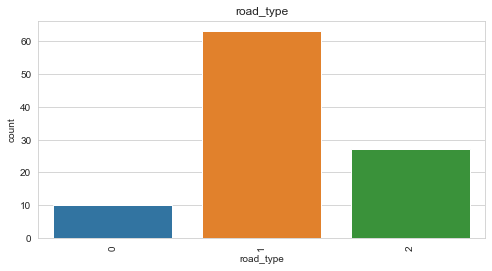

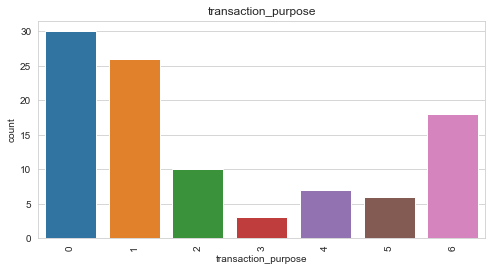

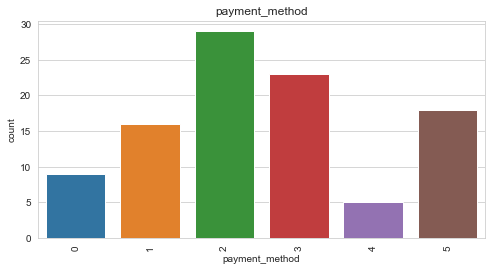

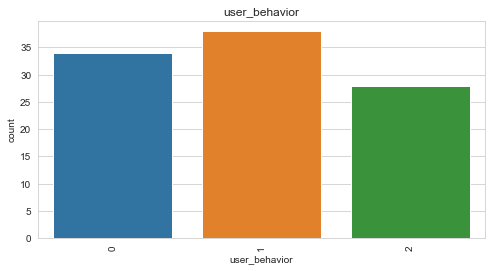

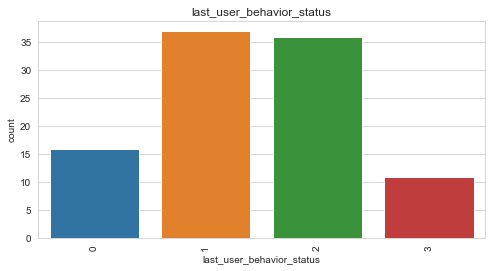

...

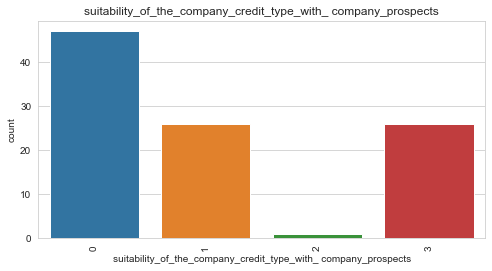

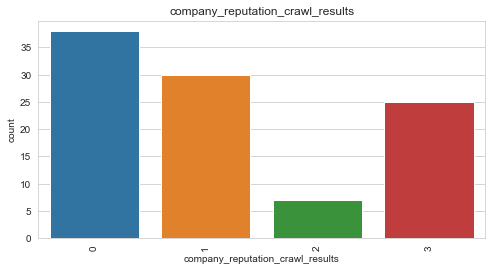

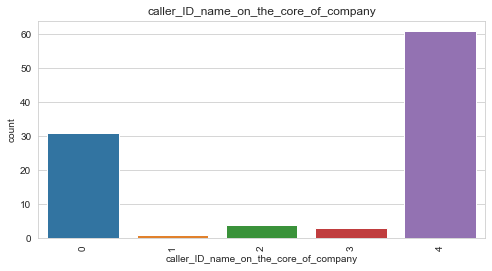

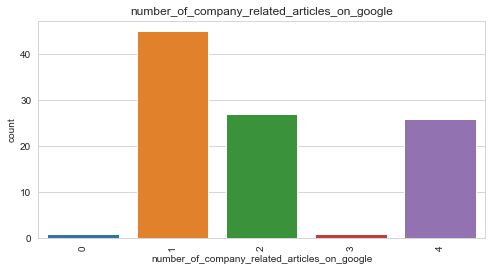

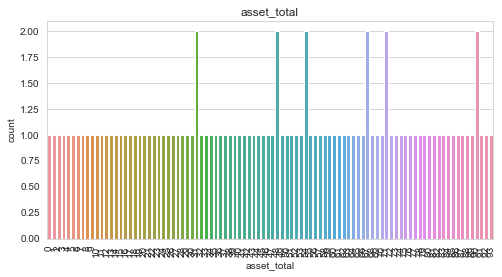

In [31]:
for col in categorical_cols:
    plt.figure(figsize=(8, 4))
    sns.set_style('whitegrid')
    plt.title(col)
    sns.barplot(x=col, y='count', data=df[col].value_counts().reset_index().rename(columns={'index':col, col:'count'}))
    plt.xticks(rotation=90)
    plt.show()

### Numerical Data

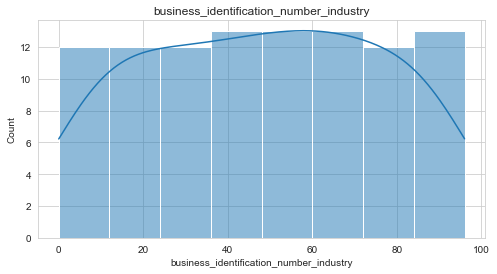

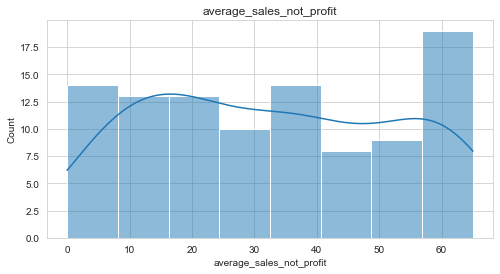

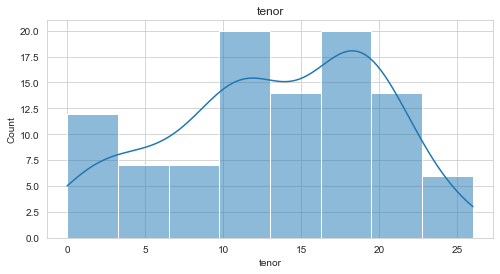

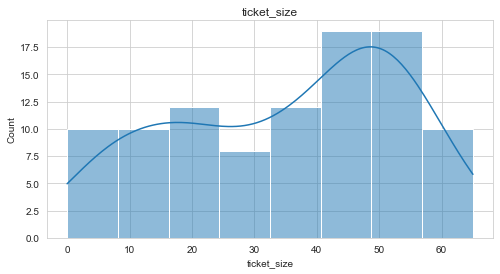

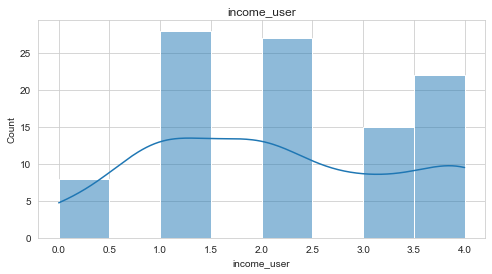

...

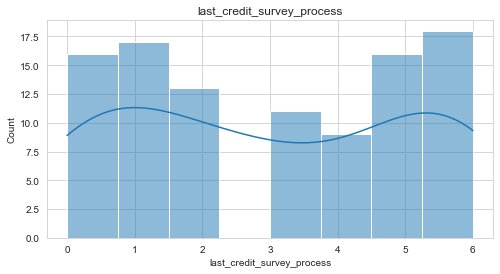

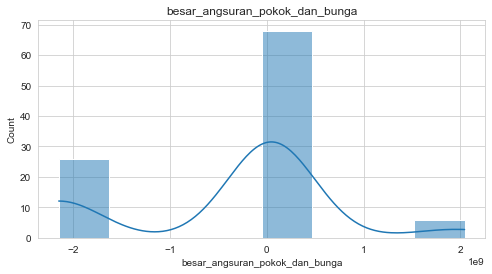

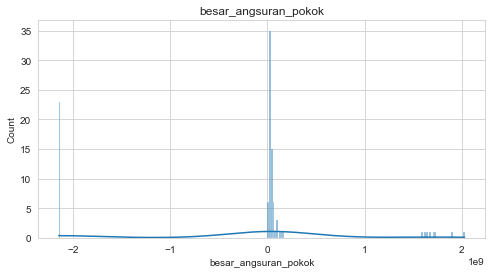

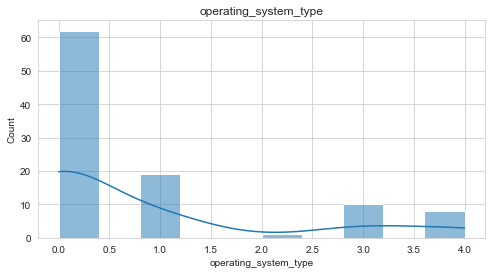

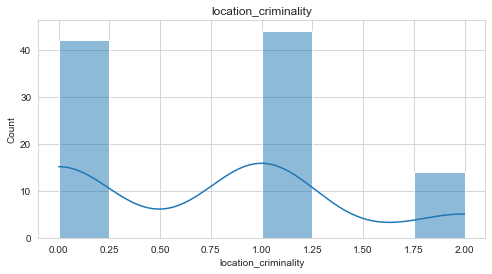

In [32]:
# histogram
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.set_style('whitegrid')
    plt.title(col)
    sns.histplot(df[col], kde=True)
    plt.show()

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


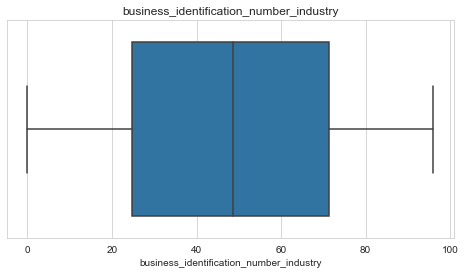

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


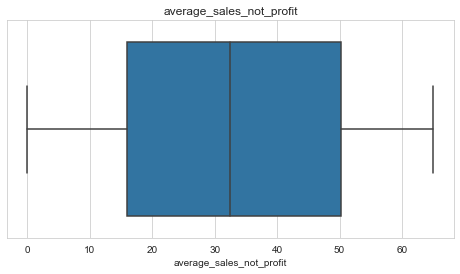

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


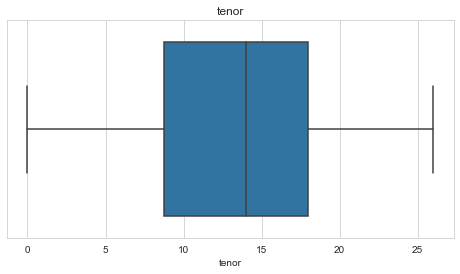

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


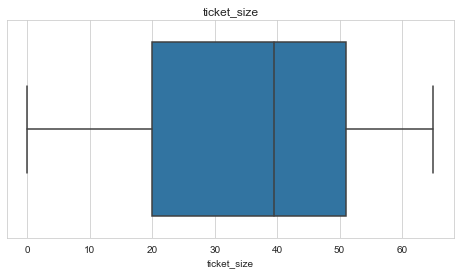

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


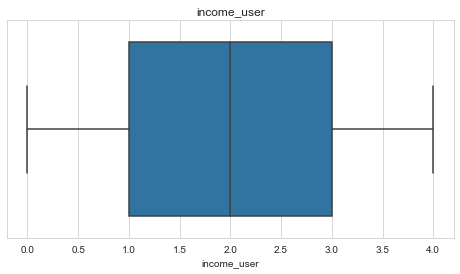

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


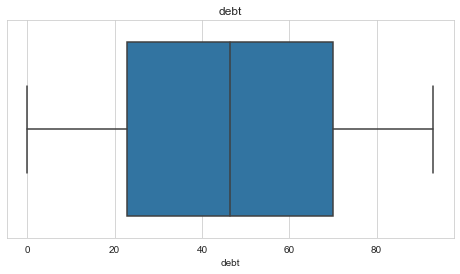

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


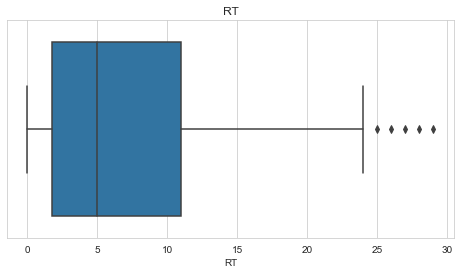

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


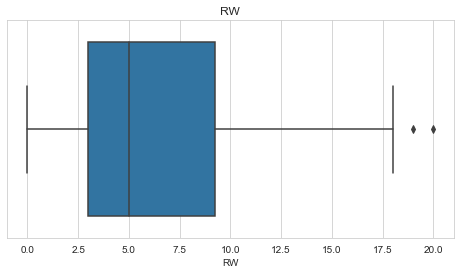

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


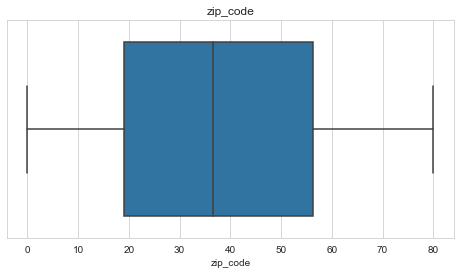

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


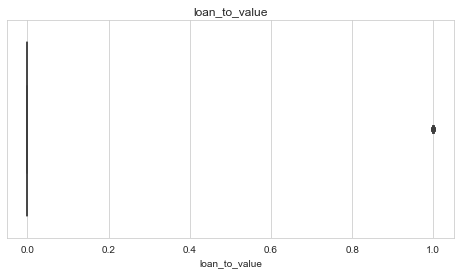

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


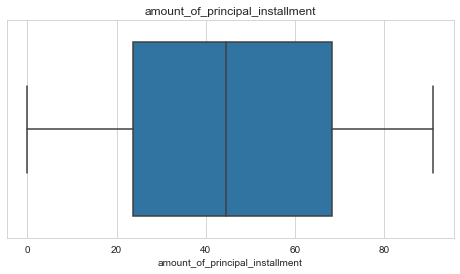

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


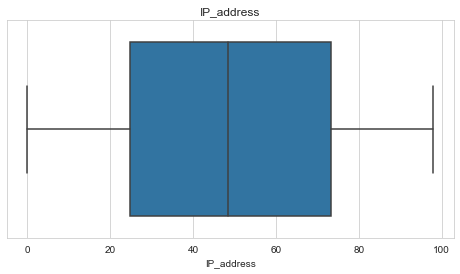

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


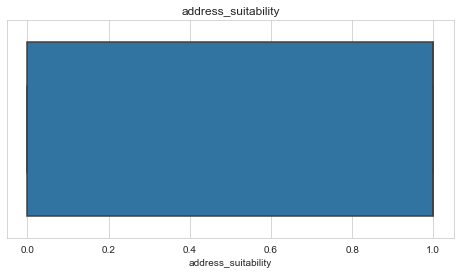

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


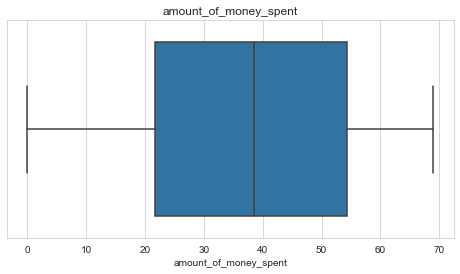

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


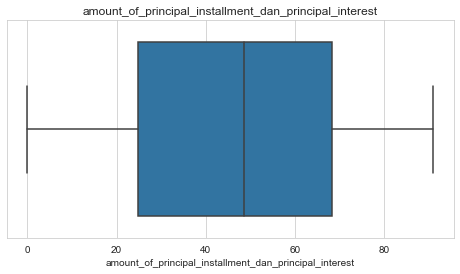

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


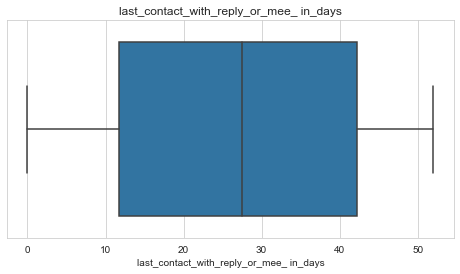

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


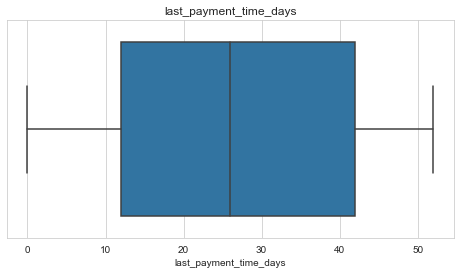

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


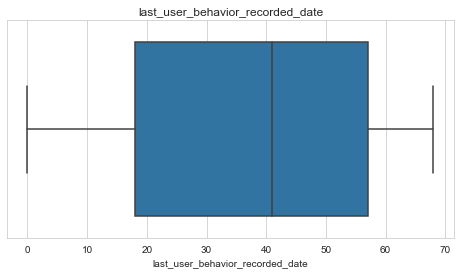

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


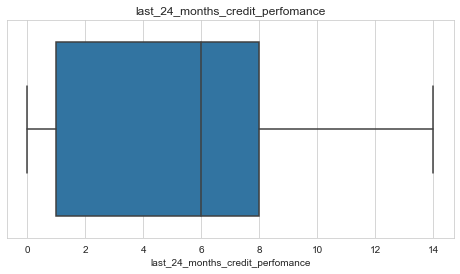

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


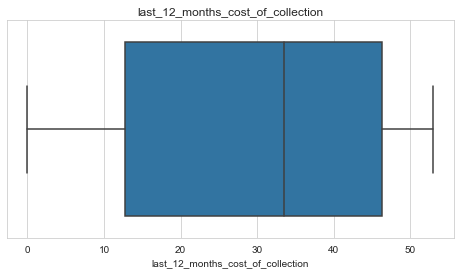

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


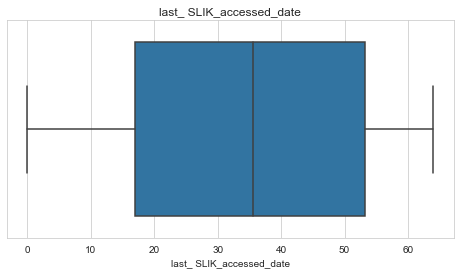

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


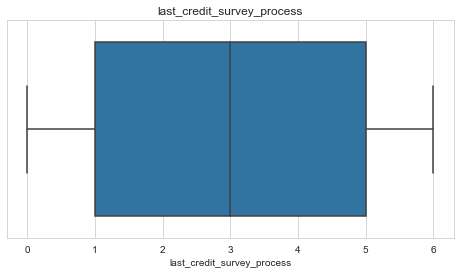

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


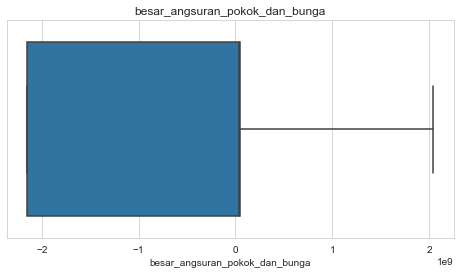

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


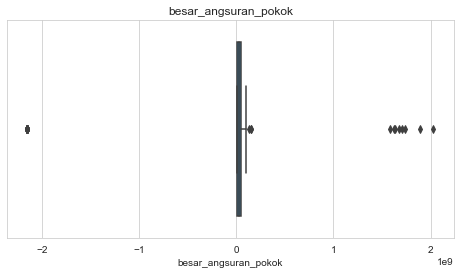

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


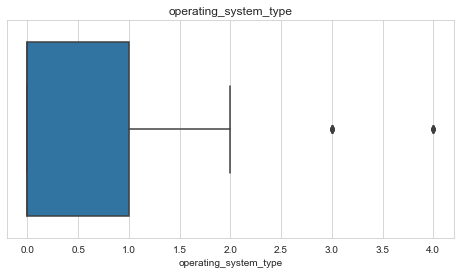

C:\Users\ACER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


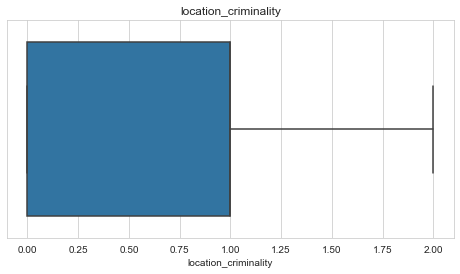

In [33]:
# boxplot for outlier detection
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.set_style('whitegrid')
    plt.title(col)
    sns.boxplot(df[col])
    plt.show()

### Exploratory Data Analysis (Multivariate Analysis)

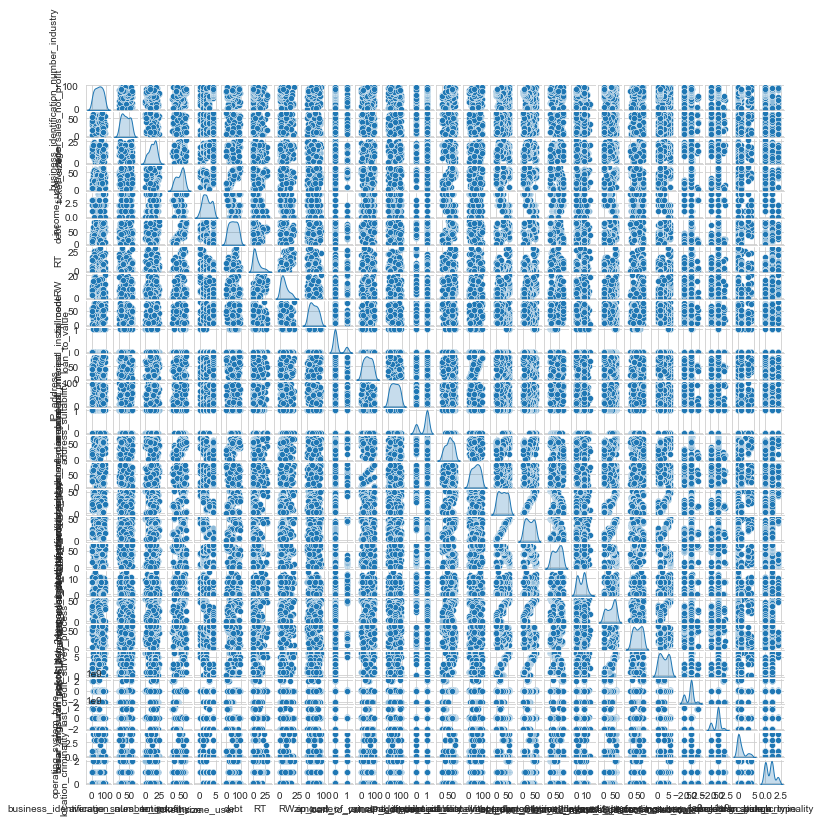

In [34]:
# pairplot
sns.pairplot(df[numerical_cols], diag_kind='kde')
plt.gcf().set_size_inches(10, 10)
plt.show()

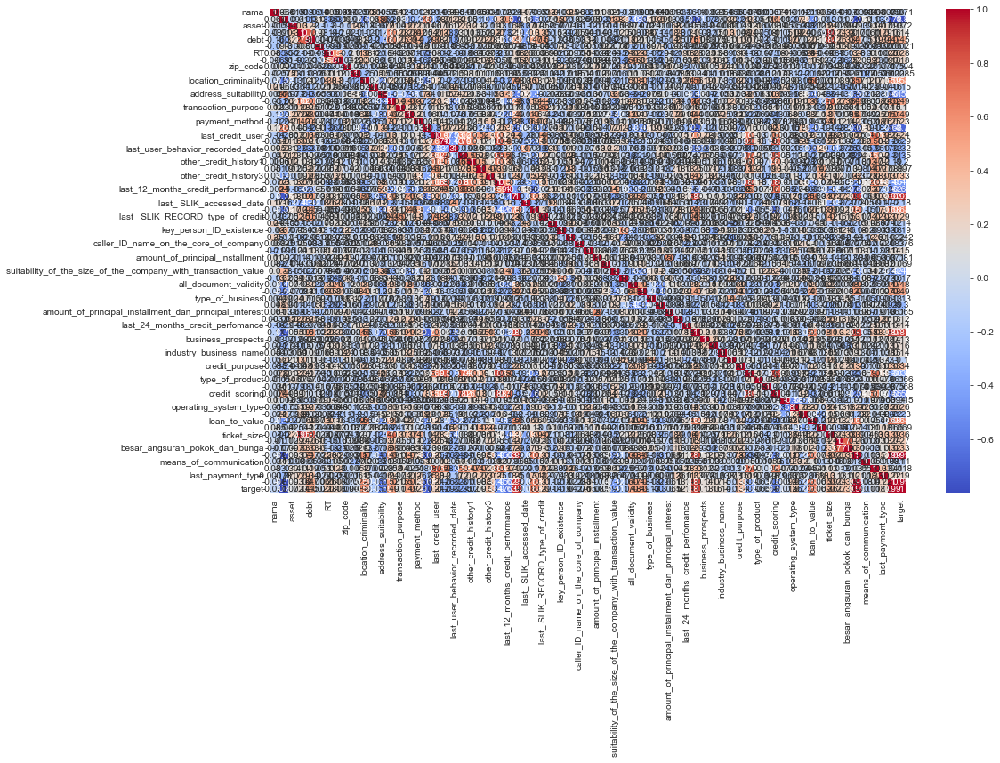

In [35]:
# melihat korelasi antar kolom
plt.figure(figsize=(16, 10))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.show()

In [36]:
df.corr()

,nama,income_user,asset,asset_total,debt,address,RT,RW,zip_code,road_type,...,tenor,ticket_size,besar_angsuran_pokok,besar_angsuran_pokok_dan_bunga,last_contact_with_reply_or_mee_ in_days,means_of_communication,still_have_existing_credit,last_payment_type,last_payment_time_days,target
nama,1.000000,0.065167,-0.014761,-0.088531,-0.158248,-0.187867,0.084821,-0.006872,0.017421,-0.024616,...,0.084555,-0.084448,-0.010242,-0.070069,-0.039364,-0.033918,0.033293,-0.000782,-0.058372,-0.071173
income_user,0.065167,1.000000,-0.093728,-0.013723,-0.302272,0.126371,-0.347861,-0.309643,0.098639,-0.074951,...,-0.039563,-0.198514,-0.114396,-0.073723,-0.787795,0.112726,-0.125388,-0.272298,-0.782784,-0.798521
asset,-0.014761,-0.093728,1.000000,0.299307,0.215498,-0.100589,-0.201261,-0.101668,-0.105568,0.225246,...,0.025069,0.243903,0.028520,0.097044,0.092950,-0.093025,0.135882,0.167100,0.092562,0.071613
asset_total,-0.088531,-0.013723,0.299307,1.000000,0.782376,0.079696,-0.144063,-0.198260,-0.019769,-0.112313,...,-0.042143,0.949450,0.242537,0.328841,0.168406,-0.006125,0.105731,0.292202,0.164093,0.136969
debt,-0.158248,-0.302272,0.215498,0.782376,1.000000,-0.004693,-0.039981,-0.033448,-0.045634,-0.082164,...,0.122697,0.844940,0.259716,0.330870,0.468233,-0.052684,0.189542,0.340622,0.469853,0.449351
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
means_of_communication,-0.033918,0.112726,-0.093025,-0.006125,-0.052684,-0.062183,-0.102076,0.059285,-0.027176,-0.266681,...,-0.125877,0.004552,-0.012508,-0.001337,-0.109267,1.000000,0.050943,0.018283,-0.081396,-0.113935
still_have_existing_credit,0.033293,-0.125388,0.135882,0.105731,0.189542,-0.053207,0.113235,0.230809,-0.103517,0.005229,...,0.099777,0.134716,0.012545,-0.101503,0.035261,0.050943,1.000000,0.329946,0.041091,0.017743
last_payment_type,-0.000782,-0.272298,0.167100,0.292202,0.340622,-0.027047,-0.002470,-0.090224,-0.070672,-0.061044,...,0.180547,0.298938,0.128480,0.111629,0.210442,0.018283,0.329946,1.000000,0.215109,0.191675
last_payment_time_days,-0.058372,-0.782784,0.092562,0.164093,0.469853,-0.006121,0.257983,0.177585,-0.075131,-0.021502,...,0.065602,0.388223,0.243015,0.323269,0.986396,-0.081396,0.041091,0.215109,1.000000,0.990405


### Encoding Fitur Categorical

In [37]:
df_encoded = df.copy()

In [38]:
from sklearn.preprocessing import LabelEncoder

# label encoding
le = LabelEncoder()
for col in categorical_cols:
    df_encoded[col] = le.fit_transform(df_encoded[col])
    
df_encoded.head()

,nama,income_user,asset,asset_total,debt,address,RT,RW,zip_code,road_type,...,tenor,ticket_size,besar_angsuran_pokok,besar_angsuran_pokok_dan_bunga,last_contact_with_reply_or_mee_ in_days,means_of_communication,still_have_existing_credit,last_payment_type,last_payment_time_days,target
0,73,0,10,4,21,5,12,5,17,2,...,0,9,23295768,27489007,52,0,1,2,50,6
1,65,0,39,2,23,79,1,7,3,1,...,0,9,23819803,28107367,52,0,1,2,51,6
2,45,0,1,51,29,44,2,6,42,1,...,12,53,50905261,60068208,52,4,1,2,51,6
3,30,0,15,39,78,72,10,19,13,2,...,6,39,54448420,64249136,52,4,1,2,48,6
4,40,2,17,42,71,66,5,4,79,1,...,11,42,43695576,51560780,52,4,1,2,49,6


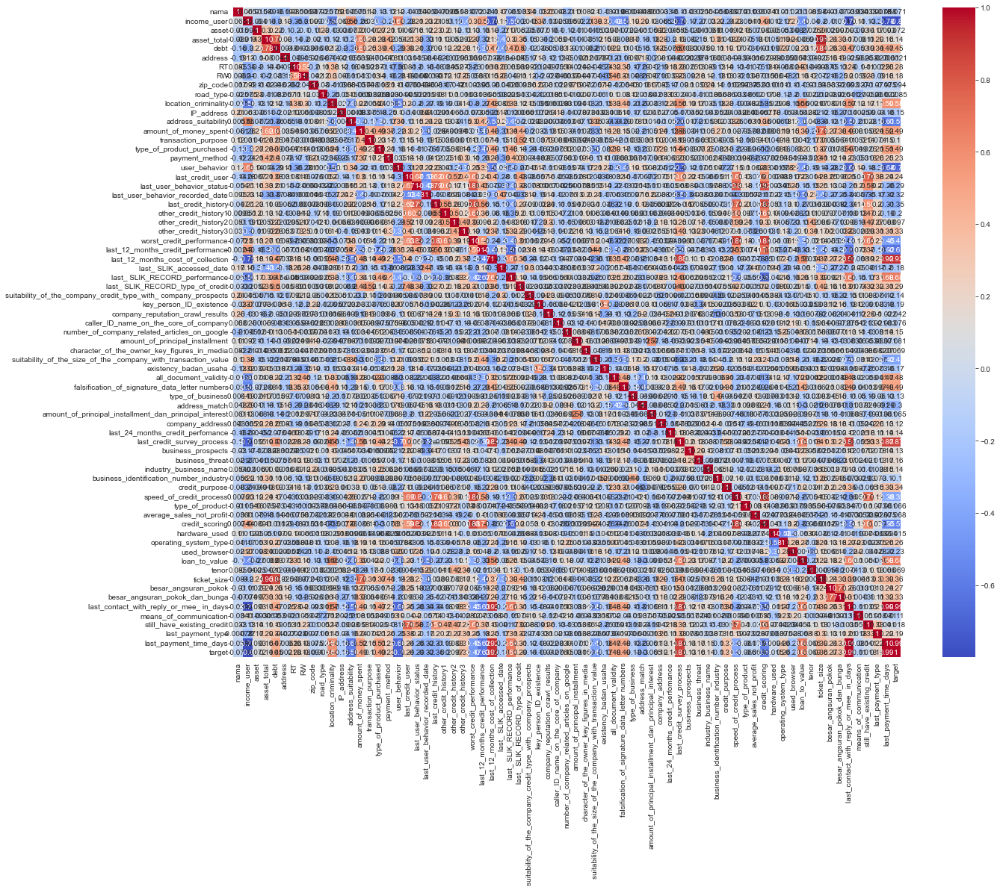

In [39]:
# korelasi antar kolom setelah label encoding
plt.figure(figsize=(20, 16))
sns.heatmap(df_encoded.corr(), annot=True, cmap='coolwarm')
plt.show()

In [40]:
df_encoded.corr()

,nama,income_user,asset,asset_total,debt,address,RT,RW,zip_code,road_type,...,tenor,ticket_size,besar_angsuran_pokok,besar_angsuran_pokok_dan_bunga,last_contact_with_reply_or_mee_ in_days,means_of_communication,still_have_existing_credit,last_payment_type,last_payment_time_days,target
nama,1.000000,0.065167,-0.014761,-0.088531,-0.158248,-0.187867,0.084821,-0.006872,0.017421,-0.024616,...,0.084555,-0.084448,-0.010242,-0.070069,-0.039364,-0.033918,0.033293,-0.000782,-0.058372,-0.071173
income_user,0.065167,1.000000,-0.093728,-0.013723,-0.302272,0.126371,-0.347861,-0.309643,0.098639,-0.074951,...,-0.039563,-0.198514,-0.114396,-0.073723,-0.787795,0.112726,-0.125388,-0.272298,-0.782784,-0.798521
asset,-0.014761,-0.093728,1.000000,0.299307,0.215498,-0.100589,-0.201261,-0.101668,-0.105568,0.225246,...,0.025069,0.243903,0.028520,0.097044,0.092950,-0.093025,0.135882,0.167100,0.092562,0.071613
asset_total,-0.088531,-0.013723,0.299307,1.000000,0.782376,0.079696,-0.144063,-0.198260,-0.019769,-0.112313,...,-0.042143,0.949450,0.242537,0.328841,0.168406,-0.006125,0.105731,0.292202,0.164093,0.136969
debt,-0.158248,-0.302272,0.215498,0.782376,1.000000,-0.004693,-0.039981,-0.033448,-0.045634,-0.082164,...,0.122697,0.844940,0.259716,0.330870,0.468233,-0.052684,0.189542,0.340622,0.469853,0.449351
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
means_of_communication,-0.033918,0.112726,-0.093025,-0.006125,-0.052684,-0.062183,-0.102076,0.059285,-0.027176,-0.266681,...,-0.125877,0.004552,-0.012508,-0.001337,-0.109267,1.000000,0.050943,0.018283,-0.081396,-0.113935
still_have_existing_credit,0.033293,-0.125388,0.135882,0.105731,0.189542,-0.053207,0.113235,0.230809,-0.103517,0.005229,...,0.099777,0.134716,0.012545,-0.101503,0.035261,0.050943,1.000000,0.329946,0.041091,0.017743
last_payment_type,-0.000782,-0.272298,0.167100,0.292202,0.340622,-0.027047,-0.002470,-0.090224,-0.070672,-0.061044,...,0.180547,0.298938,0.128480,0.111629,0.210442,0.018283,0.329946,1.000000,0.215109,0.191675
last_payment_time_days,-0.058372,-0.782784,0.092562,0.164093,0.469853,-0.006121,0.257983,0.177585,-0.075131,-0.021502,...,0.065602,0.388223,0.243015,0.323269,0.986396,-0.081396,0.041091,0.215109,1.000000,0.990405


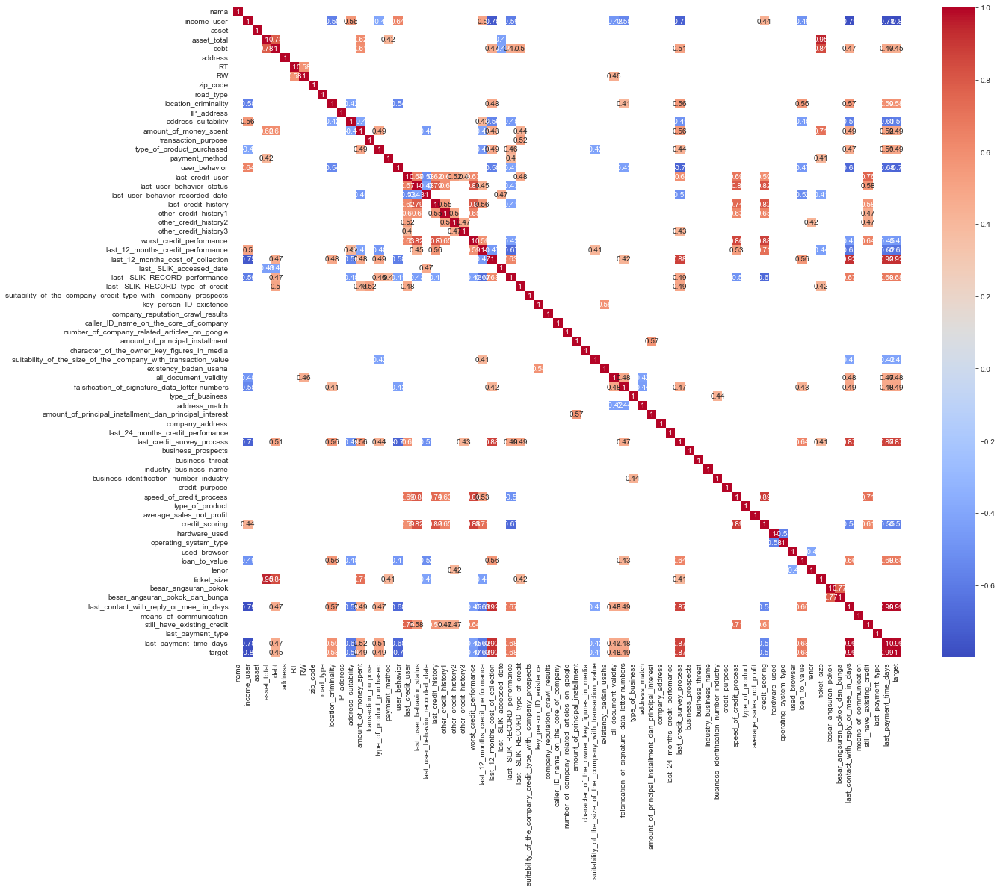

In [41]:
# get variable with high correlation
high_corr = df_encoded.corr()[abs(df_encoded.corr()) > 0.4]
plt.figure(figsize=(20, 16))
sns.heatmap(high_corr, annot=True, cmap='coolwarm')
plt.show()

In [42]:
#--- Menghilangkan variabel dengan nilai korelasi < 0.4

# calculate correlation between features and target
corr_with_target = df_encoded.corrwith(df['target'])

# get variables with correlation < 0.4
low_corr_vars = corr_with_target[abs(corr_with_target) < 0.4].index.tolist()

# drop variables with low correlation
df_encoded = df_encoded.drop(low_corr_vars, axis=1)

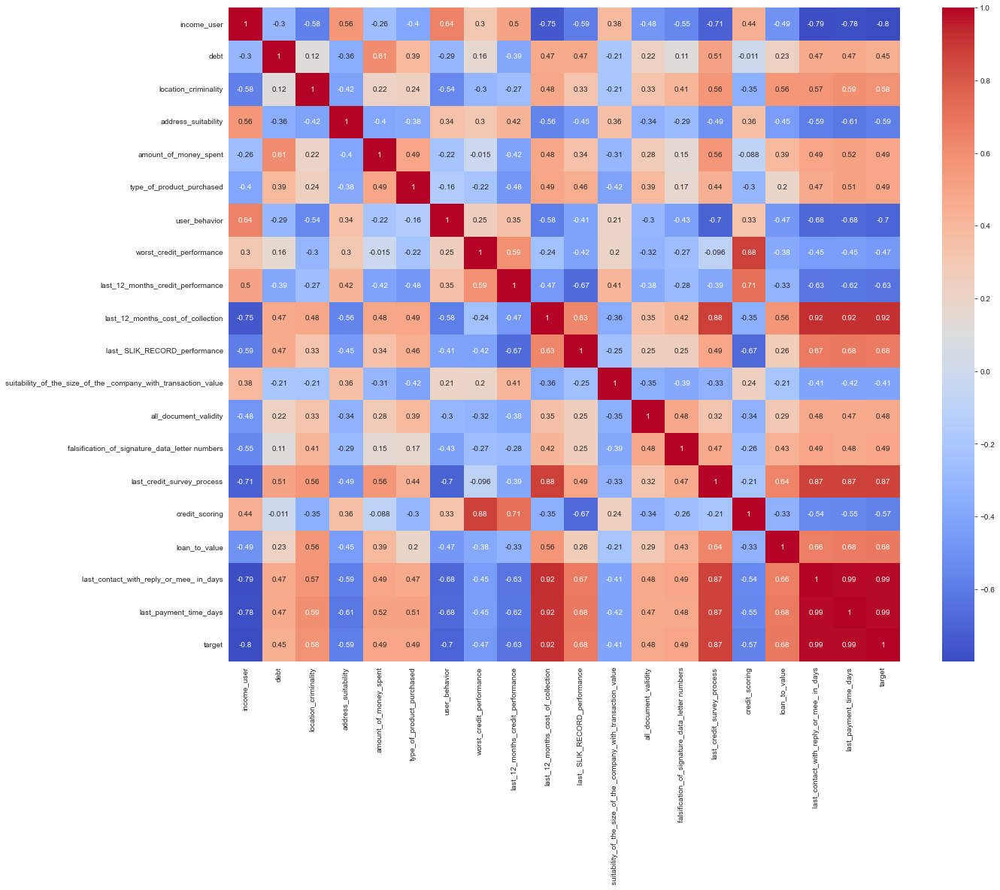

In [43]:
# korelasi antar kolom setelah label encoding
plt.figure(figsize=(20, 16))
sns.heatmap(df_encoded.corr(), annot=True, cmap='coolwarm')
plt.show()

In [44]:
df_encoded.corr()

,income_user,debt,location_criminality,address_suitability,amount_of_money_spent,type_of_product_purchased,user_behavior,worst_credit_performance,last_12_months_credit_performance,last_12_months_cost_of_collection,last_ SLIK_RECORD_performance,suitability_of_the_size_of_the _company_with_transaction_value,all_document_validity,falsification_of_signature_data_letter numbers,last_credit_survey_process,credit_scoring,loan_to_value,last_contact_with_reply_or_mee_ in_days,last_payment_time_days,target
income_user,1.000000,-0.302272,-0.577358,0.562303,-0.261031,-0.401035,0.641939,0.304207,0.502546,-0.746073,-0.594677,0.382245,-0.479728,-0.551114,-0.713423,0.443361,-0.492952,-0.787795,-0.782784,-0.798521
debt,-0.302272,1.000000,0.117677,-0.358896,0.606139,0.387730,-0.293302,0.163533,-0.394318,0.470457,0.466532,-0.206916,0.223222,0.112755,0.507537,-0.010552,0.226460,0.468233,0.469853,0.449351
location_criminality,-0.577358,0.117677,1.000000,-0.416641,0.216166,0.235038,-0.544740,-0.302789,-0.265781,0.484631,0.331646,-0.210059,0.328681,0.411265,0.557643,-0.352004,0.561981,0.571417,0.594803,0.583551
address_suitability,0.562303,-0.358896,-0.416641,1.000000,-0.400221,-0.380107,0.344137,0.300788,0.418177,-0.564059,-0.454534,0.355854,-0.339292,-0.285646,-0.493213,0.355098,-0.451779,-0.586950,-0.610708,-0.587724
amount_of_money_spent,-0.261031,0.606139,0.216166,-0.400221,1.000000,0.489026,-0.222319,-0.014880,-0.415259,0.482129,0.340748,-0.306423,0.277848,0.154874,0.558807,-0.087648,0.385216,0.492384,0.515134,0.488504
type_of_product_purchased,-0.401035,0.387730,0.235038,-0.380107,0.489026,1.000000,-0.163825,-0.217694,-0.475309,0.492799,0.457769,-0.417376,0.386737,0.165746,0.440475,-0.303553,0.196062,0.468820,0.508796,0.490279
user_behavior,0.641939,-0.293302,-0.544740,0.344137,-0.222319,-0.163825,1.000000,0.252123,0.349780,-0.584317,-0.413190,0.208885,-0.303955,-0.429131,-0.700764,0.333964,-0.471271,-0.682659,-0.676877,-0.698232
worst_credit_performance,0.304207,0.163533,-0.302789,0.300788,-0.014880,-0.217694,0.252123,1.000000,0.586217,-0.242188,-0.422198,0.201727,-0.321753,-0.267115,-0.095610,0.878129,-0.382982,-0.447447,-0.446969,-0.467641
last_12_months_credit_performance,0.502546,-0.394318,-0.265781,0.418177,-0.415259,-0.475309,0.349780,0.586217,1.000000,-0.465677,-0.667338,0.414695,-0.380816,-0.283443,-0.394209,0.713785,-0.327153,-0.625912,-0.622843,-0.631824
last_12_months_cost_of_collection,-0.746073,0.470457,0.484631,-0.564059,0.482129,0.492799,-0.584317,-0.242188,-0.465677,1.000000,0.633190,-0.364372,0.350493,0.420773,0.877573,-0.352432,0.563776,0.924050,0.919090,0.920051


In [45]:
categorical = ['road_type', 'transaction_purpose', 'payment_method', 'user_behavior', 'last_user_behavior_status', 'last_credit_history', 'other_credit_history1', 'other_credit_history2', 'other_credit_history3', 
                    'last_ SLIK_RECORD_type_of_credit', 'means_of_communication', 'last_payment_type', 'type_of_business', 'credit_purpose', 'type_of_product', 'business_prospects', 'business_threat', 
                    'company_reputation_crawl_results', 'character_of_the_owner_key_figures_in_media', 'nama', 'asset', 'address', 'type_of_product_purchased', 'last_ SLIK_RECORD_performance', 'hardware_used', 
                    'industry_business_name', 'worst_credit_performance', 'still_have_existing_credit', 'company_address', 'speed_of_credit_process', 'key_person_ID_existence', 
                    'existency_badan_usaha', 'all_document_validity', 'falsification_of_signature_data_letter numbers', 'address_match', 'suitability_of_the_size_of_the _company_with_transaction_value', 
                    'suitability_of_the_company_credit_type_with_ company_prospects', 'company_reputation_crawl_results', 'caller_ID_name_on_the_core_of_company', 'number_of_company_related_articles_on_google', 'asset_total']
numerical = ['business_identification_number_industry', 'average_sales_not_profit', 'tenor', 'ticket_size', 'income_user', 'debt', 'RT', 'RW', 'zip_code', 'loan_to_value',
                  'amount_of_principal_installment', 'IP_address', 'address_suitability', 'amount_of_money_spent', 'amount_of_principal_installment_dan_principal_interest', 
                  'last_contact_with_reply_or_mee_ in_days', 'last_payment_time_days', 'last_user_behavior_recorded_date', 'last_24_months_credit_perfomance', 
                  'last_12_months_cost_of_collection', 'last_ SLIK_accessed_date', 'last_credit_survey_process', 'besar_angsuran_pokok_dan_bunga', 'besar_angsuran_pokok', 
                  'operating_system_type', 'location_criminality', 'credit_scoring']

In [46]:
numeric_df = df[numerical]
categorical_df = df[categorical]

In [47]:
# One-hot encode the categorical features
encoder = OneHotEncoder()
encoded_categorical_data = encoder.fit_transform(categorical_df)

In [48]:
import joblib

joblib.dump(encoder, "onehot_encoder.joblib")

['onehot_encoder.joblib']

## Uji Korelasi

In [49]:
unique_values = {}
for col in df_vis.columns:
    unique_values[col] = df_vis[col].value_counts().shape[0]

pd.DataFrame(unique_values, index=["unique value count"]).transpose()

,unique value count
nama,100
income_user,5
asset,47
asset_total,94
debt,94
...,...
means_of_communication,5
still_have_existing_credit,3
last_payment_type,6
last_payment_time_days,53


In [50]:
df

,nama,income_user,asset,asset_total,debt,address,RT,RW,zip_code,road_type,...,tenor,ticket_size,besar_angsuran_pokok,besar_angsuran_pokok_dan_bunga,last_contact_with_reply_or_mee_ in_days,means_of_communication,still_have_existing_credit,last_payment_type,last_payment_time_days,target
0,73,0,10,4,21,5,12,5,17,2,...,0,9,23295768,27489007,52,0,1,2,50,6
1,65,0,39,2,23,79,1,7,3,1,...,0,9,23819803,28107367,52,0,1,2,51,6
2,45,0,1,51,29,44,2,6,42,1,...,12,53,50905261,60068208,52,4,1,2,51,6
3,30,0,15,39,78,72,10,19,13,2,...,6,39,54448420,64249136,52,4,1,2,48,6
4,40,2,17,42,71,66,5,4,79,1,...,11,42,43695576,51560780,52,4,1,2,49,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,81,4,30,89,47,9,1,1,32,1,...,11,60,41828709,49357877,1,4,1,3,0,0
96,82,4,20,92,82,91,0,2,10,1,...,14,64,40706126,48033229,5,1,1,1,5,0
97,39,4,29,88,45,97,9,8,7,1,...,6,57,45037531,53144286,3,4,1,3,4,0
98,91,4,22,87,39,90,0,0,36,1,...,16,56,21386800,25236424,4,4,1,3,3,0


In [51]:
# Create correlation matrix
correlation = df.corr()
corr_matrix_absolute = correlation.abs()

# Select upper triangle of correlation matrix
upper = corr_matrix_absolute.where(np.triu(np.ones(corr_matrix_absolute.shape), k=1).astype(bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.4)]
to_drop

['debt',
 'RW',
 'location_criminality',
 'address_suitability',
 'amount_of_money_spent',
 'type_of_product_purchased',
 'payment_method',
 'user_behavior',
 'last_user_behavior_status',
 'last_user_behavior_recorded_date',
 'last_credit_history',
 'other_credit_history1',
 'other_credit_history2',
 'other_credit_history3',
 'worst_credit_performance',
 'last_12_months_credit_performance',
 'last_12_months_cost_of_collection',
 'last_ SLIK_accessed_date',
 'last_ SLIK_RECORD_performance',
 'last_ SLIK_RECORD_type_of_credit',
 'suitability_of_the_size_of_the _company_with_transaction_value',
 'existency_badan_usaha',
 'all_document_validity',
 'falsification_of_signature_data_letter numbers',
 'address_match',
 'amount_of_principal_installment_dan_principal_interest',
 'last_credit_survey_process',
 'business_identification_number_industry',
 'speed_of_credit_process',
 'credit_scoring',
 'operating_system_type',
 'loan_to_value',
 'tenor',
 'ticket_size',
 'besar_angsuran_pokok_dan_bu

<AxesSubplot:>

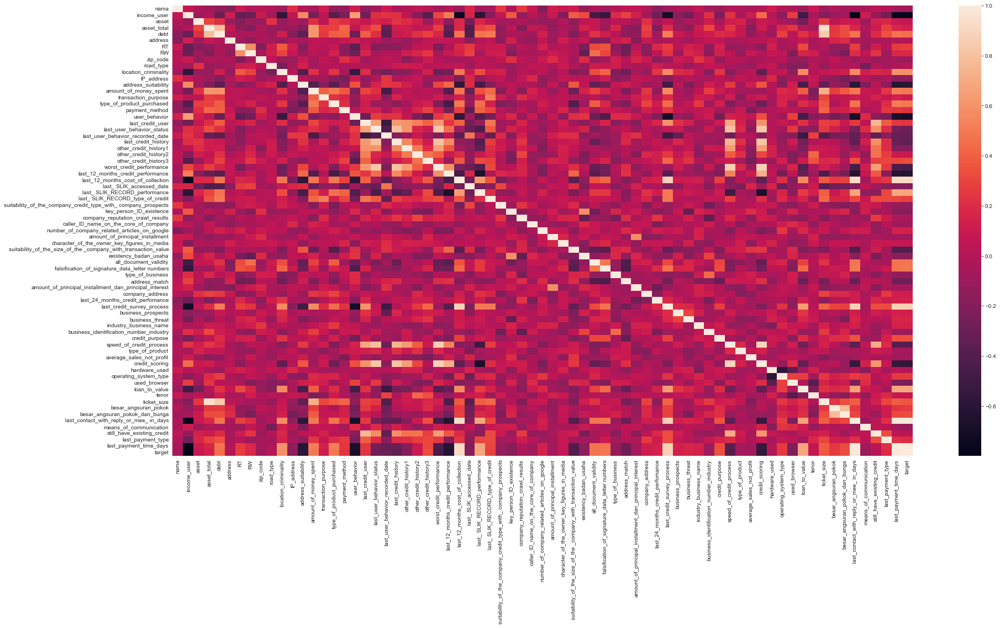

In [52]:
import seaborn as sns
plt.figure(figsize=(30,15))
sns.heatmap(correlation,xticklabels=correlation.columns,
            yticklabels=correlation.columns)

<AxesSubplot:>

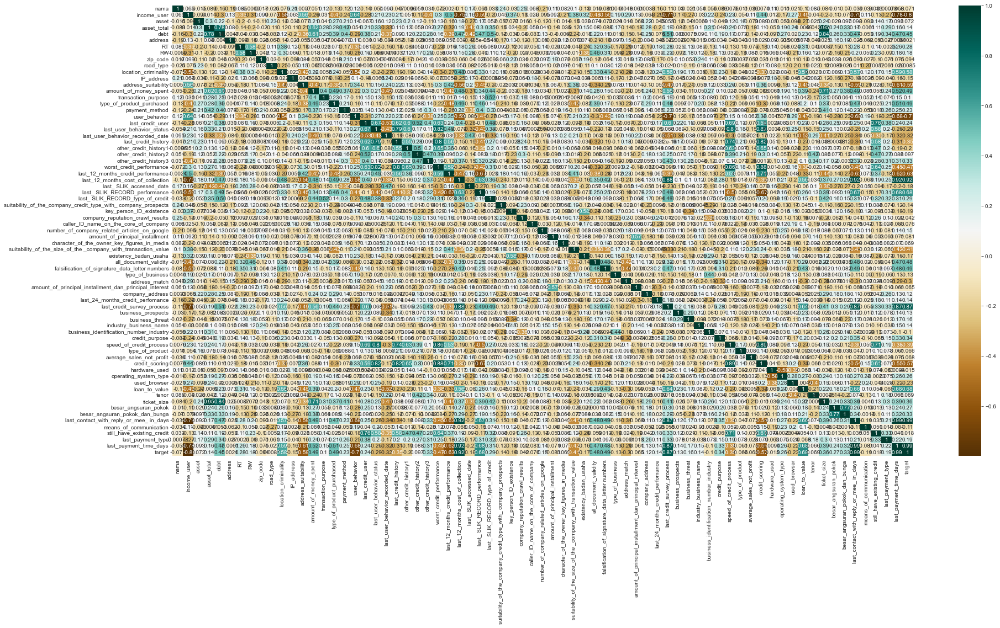

In [53]:
plt.figure(figsize=(30,15))
sns.heatmap(correlation,cmap="BrBG",annot=True)

In [54]:
df.columns

Index(['nama', 'income_user', 'asset', 'asset_total', 'debt', 'address', 'RT',
       'RW', 'zip_code', 'road_type', 'location_criminality', 'IP_address',
       'address_suitability', 'amount_of_money_spent', 'transaction_purpose',
       'type_of_product_purchased', 'payment_method', 'user_behavior',
       'last_credit_user', 'last_user_behavior_status',
       'last_user_behavior_recorded_date', 'last_credit_history',
       'other_credit_history1', 'other_credit_history2',
       'other_credit_history3', 'worst_credit_performance',
       'last_12_months_credit_performance',
       'last_12_months_cost_of_collection', 'last_ SLIK_accessed_date',
       'last_ SLIK_RECORD_performance', 'last_ SLIK_RECORD_type_of_credit',
       'suitability_of_the_company_credit_type_with_ company_prospects',
       'key_person_ID_existence', 'company_reputation_crawl_results',
       'caller_ID_name_on_the_core_of_company',
       'number_of_company_related_articles_on_google',
       'amount_of_p

In [55]:
# Step 1: Check the names of all the columns in the DataFrame
print(df.columns)

# Step 2: Compare the names of the columns in the DataFrame with the names in the `column_drop` list
columns_drop = ['asset_total','debt','road_type','transaction_purpose','payment_method', 'last_credit_user', 
               'last_user_behavior_status', 'last_credit_history','other_credit_history1',
               'other_credit_history2', 'other_credit_history3','last_ SLIK_RECORD_performance',
               'last_ SLIK_RECORD_type_of_credit', 'speed_of_credit_process','operating_system_type',
               'used_browser', 'credit_purpose', 'tenor/bulan', 'ticket_size', 'besar_angsuran_pokok',
               'means_of_communication', 'still_have_existing_credit', 'last_payment_type','last_ SLIK_accessed_date',
               'type_of_product_purchased', 'asset']

missing_columns = set(columns_drop) - set(df.columns)

if missing_columns:
    # Step 3: If some of the names in the `column_drop` list are not present in the DataFrame, remove them from the list
    print(f"The following columns are missing in the DataFrame: {missing_columns}")
    columns_drop = list(set(columns_drop) - missing_columns)

df.drop(columns_drop, axis=1, inplace=True)

Index(['nama', 'income_user', 'asset', 'asset_total', 'debt', 'address', 'RT',
       'RW', 'zip_code', 'road_type', 'location_criminality', 'IP_address',
       'address_suitability', 'amount_of_money_spent', 'transaction_purpose',
       'type_of_product_purchased', 'payment_method', 'user_behavior',
       'last_credit_user', 'last_user_behavior_status',
       'last_user_behavior_recorded_date', 'last_credit_history',
       'other_credit_history1', 'other_credit_history2',
       'other_credit_history3', 'worst_credit_performance',
       'last_12_months_credit_performance',
       'last_12_months_cost_of_collection', 'last_ SLIK_accessed_date',
       'last_ SLIK_RECORD_performance', 'last_ SLIK_RECORD_type_of_credit',
       'suitability_of_the_company_credit_type_with_ company_prospects',
       'key_person_ID_existence', 'company_reputation_crawl_results',
       'caller_ID_name_on_the_core_of_company',
       'number_of_company_related_articles_on_google',
       'amount_of_p

<AxesSubplot:>

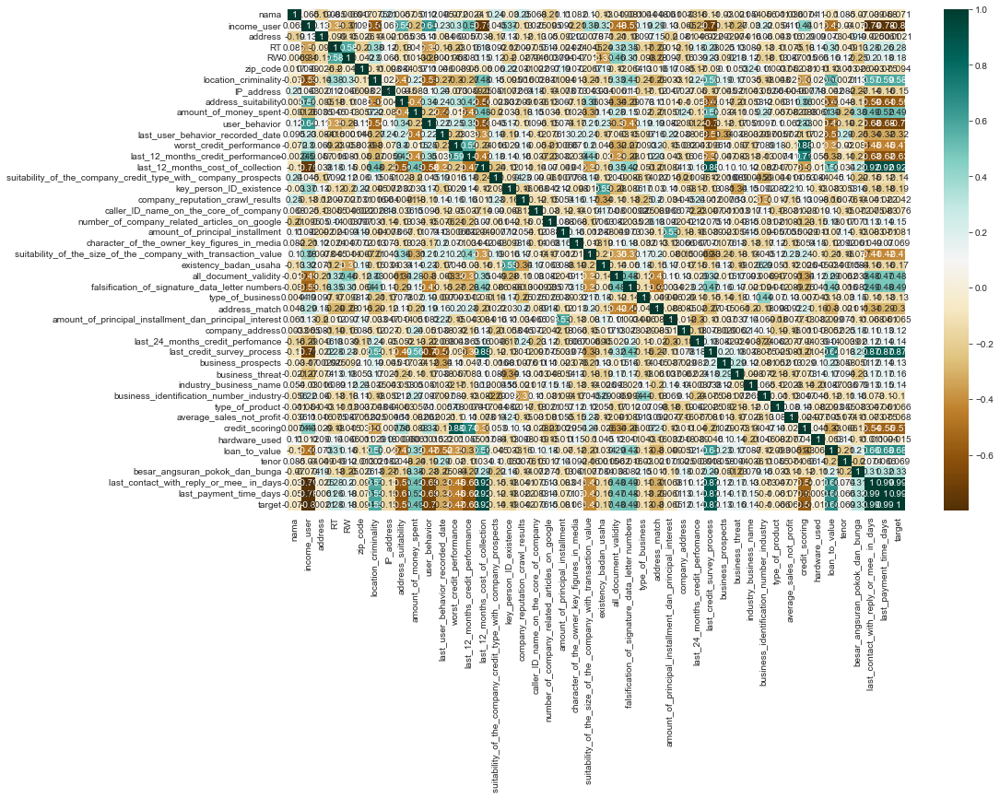

In [56]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),cmap="BrBG",annot=True)

In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 46 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   nama                                                            100 non-null    int64  
 1   income_user                                                     100 non-null    int32  
 2   address                                                         100 non-null    int64  
 3   RT                                                              100 non-null    int64  
 4   RW                                                              100 non-null    int64  
 5   zip_code                                                        100 non-null    int64  
 6   location_criminality                                            100 non-null    int32  
 7   IP_address                                            

## Membuat Model (Machine Learning)

In [58]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [59]:
x = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

In [60]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

## Model Decision Tree Classifier

In [61]:
from sklearn.tree import DecisionTreeClassifier

In [62]:
dt = DecisionTreeClassifier()

In [63]:
dt.fit(x_train, y_train)
pred_fraud_dt = dt.predict(x_test)
accuracy = accuracy_score(y_test, pred_fraud_dt)
print("Accuracy:", accuracy)

Accuracy: 0.8666666666666667


In [186]:
pip install lazypredict

Note: you may need to restart the kernel to use updated packages.


In [64]:
import lazypredict
from lazypredict.Supervised import LazyClassifier
from lazypredict.Supervised import LazyRegressor

In [65]:
clf = LazyClassifier()
models_clf, predictions_clf = clf.fit(x_train, x_test, y_train, y_test)
models_clf

100%|██████████| 29/29 [00:01<00:00, 25.52it/s]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
RandomForestClassifier,1.00,1.00,None,1.00,0.17
BaggingClassifier,1.00,1.00,None,1.00,0.04
ExtraTreesClassifier,0.97,0.98,None,0.97,0.13
DecisionTreeClassifier,0.97,0.97,None,0.97,0.01
GaussianNB,0.93,0.94,None,0.94,0.01
LGBMClassifier,0.90,0.93,None,0.90,0.12
XGBClassifier,0.87,0.88,None,0.87,0.11
NuSVC,0.83,0.86,None,0.85,0.01
NearestCentroid,0.83,0.86,None,0.84,0.01


In [94]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn import metrics
from sklearn.naive_bayes import GaussianNB

#### Decision Tree

In [67]:
from sklearn.tree import DecisionTreeClassifier

DTC = DecisionTreeClassifier()
BG = BaggingClassifier(base_estimator=DTC, n_estimators=100, random_state=42)

In [68]:
dt = DecisionTreeClassifier()
dt.fit(x_train, y_train)
pred_fraud_dt = dt.predict(x_test)
accuracy = accuracy_score(y_test, pred_fraud_dt)
print("Accuracy:", accuracy)

Accuracy: 0.9666666666666667


In [69]:
DTC_new = DecisionTreeClassifier(random_state=42, criterion='entropy', max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5)
DTC_new.fit(x_train, y_train)

y_pred_DTC_new = DTC_new.predict(x_test)

# menampilkan hasil prediksi
score_train_DTC_new = DTC_new.score(x_train, y_train)
score_test_DTC_new = DTC_new.score(x_test, y_test)
print("Score Train:", score_train_DTC_new)
print("Score Test:", score_test_DTC_new)

Score Train: 1.0
Score Test: 0.9


#### Bagging Classifier

In [70]:
BG = BaggingClassifier(base_estimator=DTC, n_estimators=100, random_state=42)
BG = BG.fit(x_train, y_train)

y_pred_BG = BG.predict(x_test)

# menampilkan hasil prediksi
score_train_BG = BG.score(x_train, y_train)
score_test_BG = BG.score(x_test, y_test)
print("Score Train:", score_train_BG)
print("Score Test:", score_test_BG)

Score Train: 1.0
Score Test: 0.9666666666666667


In [71]:
BG_new = BaggingClassifier(base_estimator=DTC_new, n_estimators=100, random_state=42)
BG_new = BG_new.fit(x_train, y_train)

y_pred_BG_new = BG_new.predict(x_test)

# menampilkan hasil prediksi
score_train_BG_new = BG_new.score(x_train, y_train)
score_test_BG_new = BG_new.score(x_test, y_test)
print("Score Train:", score_train_BG_new)
print("Score Test:", score_test_BG_new)

Score Train: 1.0
Score Test: 0.9


#### Random Forest Classifier

In [72]:
RFC = RandomForestClassifier(random_state=42)
RFC = RFC.fit(x_train, y_train)

y_pred_RFC = RFC.predict(x_test)

# menampilkan hasil prediksi
score_train_RFC = RFC.score(x_train, y_train)
score_test_RFC = RFC.score(x_test, y_test)
print("Score Train:", score_train_RFC)
print("Score Test:", score_test_RFC)

Score Train: 1.0
Score Test: 1.0


In [73]:
RFC_new = RandomForestClassifier(random_state=42, n_estimators=200, max_features='auto', max_depth=5, criterion='entropy')
RFC_new = RFC_new.fit(x_train, y_train)

y_pred_RFC_new = RFC_new.predict(x_test)

# menampilkan hasil prediksi
score_train_RFC_new = RFC_new.score(x_train, y_train)
score_test_RFC_new = RFC_new.score(x_test, y_test)
print("Score Train:", score_train_RFC_new)
print("Score Test:", score_test_RFC_new)

Score Train: 1.0
Score Test: 1.0


#### Extra Trees Classifier

In [88]:
ETC = ExtraTreesClassifier(random_state=42)
ETC = ETC.fit(x_train, y_train)

y_pred_ETC = ETC.predict(x_test)

# menampilkan hasil prediksi
score_train_ETC = ETC.score(x_train, y_train)
score_test_ETC = ETC.score(x_test, y_test)
print("Score Train:", score_train_ETC)
print("Score Test:", score_test_ETC)

Score Train: 1.0
Score Test: 0.9666666666666667


In [89]:
ETC_new = ExtraTreesClassifier(random_state=42, n_estimators=200, max_features='auto', max_depth=5, criterion='entropy')
ETC_new = ETC_new.fit(x_train, y_train)

y_pred_ETC_new = ETC_new.predict(x_test)

# menampilkan hasil prediksi
score_train_ETC_new = ETC_new.score(x_train, y_train)
score_test_ETC_new = ETC_new.score(x_test, y_test)
print("Score Train:", score_train_ETC_new)
print("Score Test:", score_test_ETC_new)

Score Train: 1.0
Score Test: 0.9666666666666667


In [101]:
# mencoba model regresi
reg = LazyRegressor(verbose=0, ignore_warnings=True, custom_metric=None)
models_reg, predictions_reg = reg.fit(x_train, x_test, y_train, y_test)
models_reg

100%|██████████| 42/42 [00:02<00:00, 15.66it/s]


,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
GaussianProcessRegressor,7.13,-2.38,3.77,0.02
KernelRidge,4.72,-1.05,2.94,0.01
LassoLars,2.84,-0.01,2.06,0.02
DummyRegressor,2.84,-0.01,2.06,0.01
QuantileRegressor,2.82,-0.01,2.06,0.08
Lasso,1.48,0.73,1.06,0.02
Lars,1.47,0.74,1.04,0.04
ElasticNet,1.27,0.85,0.79,0.03
NuSVR,1.20,0.89,0.69,0.02


## Evaluation

In [108]:
# melakukan cross validation untuk mengecek overfitting
from sklearn.model_selection import cross_val_score

model_list = [("DTC", DTC), ("DTC_new", DTC_new), ("BG", BG), ("BG_new", BG_new), ("RFC", RFC), ("RFC_new", RFC_new), ("ETC", ETC), ("ETC_new", ETC_new)]
val_result = []

for model in model_list:
    scores = cross_val_score(model[1], x_train, y_train, cv=10, scoring='accuracy')
    val_result.append(scores)
    print(f"{model[0]}: {scores.mean():.2f} (+/- {scores.std():.2f})")

DTC: 0.91 (+/- 0.11)
DTC_new: 0.91 (+/- 0.11)
BG: 1.00 (+/- 0.00)
BG_new: 1.00 (+/- 0.00)
RFC: 0.96 (+/- 0.07)
RFC_new: 0.97 (+/- 0.06)
ETC: 0.93 (+/- 0.07)
ETC_new: 0.99 (+/- 0.04)


In [109]:
# perbandingan hasil prediksi
acc = pd.DataFrame({
    'Model': ['DTC', 'DTC_new', 'BG', 'BG_new', 'RFC', 'RFC_new', 'ETC', 'ETC_new'],
    'Score Train': [score_train_DTC_new, score_train_DTC_new, score_train_BG, score_train_BG_new, score_train_RFC, score_train_RFC_new, score_train_ETC, score_train_ETC_new],
    'Score Test': [score_test_DTC_new, score_test_DTC_new, score_test_BG, score_test_BG_new, score_test_RFC, score_test_RFC_new, score_test_ETC, score_test_ETC_new],
    'CV Mean': [val_result[0].mean(), val_result[1].mean(), val_result[2].mean(), val_result[3].mean(), val_result[4].mean(), val_result[5].mean(), val_result[6].mean(), val_result[7].mean()],
    'CV Std': [val_result[0].std(), val_result[1].std(), val_result[2].std(), val_result[3].std(), val_result[4].std(), val_result[5].std(), val_result[6].std(), val_result[7].std()]
})
acc

,Model,Score Train,Score Test,CV Mean,CV Std
0,DTC,1.00,0.90,0.91,0.11
1,DTC_new,1.00,0.90,0.91,0.11
2,BG,1.00,0.97,1.00,0.00
3,BG_new,1.00,0.90,1.00,0.00
4,RFC,1.00,1.00,0.96,0.07
5,RFC_new,1.00,1.00,0.97,0.06
6,ETC,1.00,0.97,0.93,0.07
7,ETC_new,1.00,0.97,0.99,0.04


In [111]:
# confusion matrix
cm_DTC = confusion_matrix(y_test, y_pred_DTC_new)
cm_DTC_new = confusion_matrix(y_test, y_pred_DTC_new)
cm_BG = confusion_matrix(y_test, y_pred_BG)
cm_BG_new = confusion_matrix(y_test, y_pred_BG_new)
cm_RFC = confusion_matrix(y_test, y_pred_RFC)
cm_RFC_new = confusion_matrix(y_test, y_pred_RFC_new)
cm_ETC = confusion_matrix(y_test, y_pred_ETC)
cm_ETC_new = confusion_matrix(y_test, y_pred_ETC_new)

print("DTC:\n", cm_DTC)
print("\nDTC_new:\n", cm_DTC_new)
print("\nBG:\n", cm_BG)
print("\nBG_new:\n", cm_BG_new)
print("\nRFC:\n", cm_RFC)
print("\nRFC_new:\n", cm_RFC_new)
print("\nRFC:\n", cm_ETC)
print("\nRFC_new:\n", cm_ETC_new)

DTC:
 [[5 0 0 0 0 0 0]
 [0 1 0 0 0 0 0]
 [0 1 5 0 0 0 0]
 [0 0 0 6 0 0 0]
 [0 0 0 0 2 0 0]
 [0 0 0 0 2 2 0]
 [0 0 0 0 0 0 6]]

DTC_new:
 [[5 0 0 0 0 0 0]
 [0 1 0 0 0 0 0]
 [0 1 5 0 0 0 0]
 [0 0 0 6 0 0 0]
 [0 0 0 0 2 0 0]
 [0 0 0 0 2 2 0]
 [0 0 0 0 0 0 6]]

BG:
 [[5 0 0 0 0 0 0]
 [0 1 0 0 0 0 0]
 [0 1 5 0 0 0 0]
 [0 0 0 6 0 0 0]
 [0 0 0 0 2 0 0]
 [0 0 0 0 0 4 0]
 [0 0 0 0 0 0 6]]

BG_new:
 [[4 1 0 0 0 0 0]
 [0 1 0 0 0 0 0]
 [0 0 6 0 0 0 0]
 [0 0 0 6 0 0 0]
 [0 0 0 0 2 0 0]
 [0 0 0 0 2 2 0]
 [0 0 0 0 0 0 6]]

RFC:
 [[5 0 0 0 0 0 0]
 [0 1 0 0 0 0 0]
 [0 0 6 0 0 0 0]
 [0 0 0 6 0 0 0]
 [0 0 0 0 2 0 0]
 [0 0 0 0 0 4 0]
 [0 0 0 0 0 0 6]]

RFC_new:
 [[5 0 0 0 0 0 0]
 [0 1 0 0 0 0 0]
 [0 0 6 0 0 0 0]
 [0 0 0 6 0 0 0]
 [0 0 0 0 2 0 0]
 [0 0 0 0 0 4 0]
 [0 0 0 0 0 0 6]]

RFC:
 [[5 0 0 0 0 0 0]
 [0 1 0 0 0 0 0]
 [0 1 5 0 0 0 0]
 [0 0 0 6 0 0 0]
 [0 0 0 0 2 0 0]
 [0 0 0 0 0 4 0]
 [0 0 0 0 0 0 6]]

RFC_new:
 [[5 0 0 0 0 0 0]
 [0 1 0 0 0 0 0]
 [0 1 5 0 0 0 0]
 [0 0 0 6 0 0 0]
 [0 0 0 0 2 0 0]
 [0 0 

## Menyimpan Model

In [114]:
# Saving the best model
pickle.dump(BG, open('BG_new_pickle.pkl', 'wb'))
pickle.dump(RFC, open('RFC_new_pickle.pkl', 'wb'))
pickle.dump(DTC, open('DTC_new_pickle.pkl', 'wb'))
pickle.dump(ETC, open('ETC_pickle.pkl', 'wb'))

In [115]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import load_iris
import joblib

# Load dataset iris
iris = load_iris()
X, y = iris.data, iris.target

# Buat model RandomForestClassifier
model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train model dengan data iris
model.fit(X, y)

# Simpan model menggunakan joblib
joblib.dump(model, "model.joblib")

['model.joblib']

In [116]:
# Load model yang telah disimpan
loaded_model = joblib.load("model.joblib")

# Gunakan model untuk melakukan prediksi
new_data = [[5.1, 3.5, 1.4, 0.2], [6.4, 3.2, 4.5, 1.5], [6.2, 2.8, 4.8, 1.8]]
predictions = loaded_model.predict(new_data)

# Tampilkan hasil prediksi
print(predictions)

[0 1 2]


## Model Deployment

In [126]:
pip install json

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement json (from versions: none)
ERROR: No matching distribution found for json


In [127]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import pickle
import requests
import json

SyntaxError: invalid non-printable character U+00A0 (3721144246.py, line 7)

In [117]:
BG_new_import.feature_names_in_

NameError: name 'BG_new_import' is not defined